<a href="https://colab.research.google.com/github/seungheonbaek58-jpg/SCODA/blob/main/scoda_practice_workshop_2c_pdac_251228.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#  __Using <font color=blue><a href=https://mlbi-lab.net>SCODA</a></font> for Single-cell RNA-seq data analysis and mining__

- This Jupyter notebook provides example code for visualizing and mining the results processed by <a href=https://mlbi-lab.net>__SCODA__</a>, a single-cell RNA-seq data analysis pipeline developed by __MLBI Lab__.
- Data mining is conducted using the __SCODA-viz__ package and includes the following components:

<br>

1. <font color=blue>Review of cell type annotation results</font>
   - Preprocessing for visualization and generation of UMAP coordinates
   - Visualization of celltype marker expression patterns
   - Examination of cell type populations and identification of condition-specific features
2. <font color=blue>Review of CNV and tumor cell identification results</font>
   - Visualization of CNV patterns via heatmap
   - Tumor cell identification confirmed via UMAP projection
3. <font color=blue>Profiling of ligand–receptor interactions between cell types</font>
  - Structure and composition of CCI result data
  - Visualization using dot plots and circle plots
  - Statistical testing of condition-specific interactions and visualization via boxplots
4. <font color=blue>Differential expression analysis and marker/target discovery</font>
  - Structure of DEG result data
  - Inspection of DEG results
  - Marker/target discovery and visualization using dot plots
5. <font color=blue>Gene set analysis (GSA) and interpretation of enrichment results</font>
  - Structure of GSA/GSEA output data
  - Visualization of GSA/GSEA results using barplots
  - Visualization of GSA/GSEA results using dotplots

6. <font color=firebrick>Auxiliary analysis using cancer genomics big data</font> (e.g., METABRIC or TCGA data)
7. <font color=firebrick>Visualization of pathway-level changes using KEGG Pathview</font> (provided in a separate notebook using R)

<br>

__MLBI-lab, July 27, 2025__

contact: mlbi@mlbi-lab.com




## __1. Install required packages and import them__

In [ ]:
## 필요한 패키지 설치 (이미 설치되었다면 skip 해도 됩니다.)
'''
!pip install gdown
!pip install numpy
!pip install pandas
!pip install scipy
!pip install matplotlib
!pip install scikit-learn
!pip install seaborn
!pip install scikit-network
!pip install statannot
!pip install statannotations
!pip install lifelines
!pip install plotly
'''
!pip install scanpy
!pip install scoda-viz==0.4.36b
## This jupyter notebook was tested with the above version of scoda-viz package.

In [ ]:
## 필요한 패키지 불러오기
import copy, warnings, os
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

from scodaviz import plot_population, plot_population_grouped
from scodaviz import plot_cci_dot, plot_cci_circ_group
from scodaviz import plot_gsa_bar, plot_gsa_dot, add_to_subset_markers
from scodaviz import plot_deg, plot_marker_exp, plot_cnv_hit
from scodaviz import plot_cnv, plot_violin, plot_pct_box
from scodaviz import get_sample_to_group_map, plot_sankey

from scodaviz import get_population_per_sample, get_cci_means, get_gene_expression_mean
from scodaviz import get_markers_from_deg, test_group_diff, filter_gsa_result
from scodaviz import find_condition_specific_markers, find_genomic_spots_of_cnv_peaks
from scodaviz import load_scoda_processed_sample_data, get_abbreviations, decompress_tar_gz
from scodaviz import get_amp_regions_for_known_markers, plot_cnv_stat
from scodaviz.misc import show_tree, scoda_ai

warnings.filterwarnings('ignore')

https://github.com/combio-dku
INFO: statannotations was sucessfully installed.


### <font color='blue'>__✅ SCODA AI 사용하기__</font>
- scoda_ai를 사용하면 일부 데이터들에 대한 설명과 해당 데이터에 근거하여 어떤 실험을 기획할 수있는지 물어볼 수 있습니다.
- [google AI studio](https://aistudio.google.com/)으로 가셔서 본인의 구글 계정으로 로그인하신 후 프로젝트를 하나 만드시고 해당 프로젝트의 api_key를 복사해서 scoda_ai 객체를 생성할 수 있습니다.
- api_key를 복사하신 후 좌측 열쇠아이콘에 scoda라는 이름으로 키를 설정하세요
- 🚀 본인의 api_key는 다른 사람이 도용하여 사용할 수도 있으니 다른 사람에게 보여주지 마십시오.
- <font color='red'>api_key 도용에 따른 피해는 책임지지 않습니다 ^^.</font>

In [ ]:
from google.colab import userdata
your_api_key = userdata.get('your_key_name')
ai = scoda_ai(api_key = your_api_key)

- ✨ 사용은 요렇게:   ai.ask( your_data, '요 데이터 설명 좀~' )

In [ ]:
## 테스트
ai.ask( "아직 데이터는 없지만 ..", "뒤에가서 많이 물어보께~")

## __2A. Download a preprocessed data__

In [ ]:
dataset = 'PDAC'  ## You can choose one of ['BC', 'NSCLC', 'PDAC', 'CRC', 'Colitis-mm', 'Colitis-hs']
adata_t = load_scoda_processed_sample_data( dataset )
adata_t

Downloading...
From (original): https://drive.google.com/uc?export=download&id=1QQ717-oCWECjRoxpLtMYP1XNO7wa7GhB
From (redirected): https://drive.google.com/uc?export=download&id=1QQ717-oCWECjRoxpLtMYP1XNO7wa7GhB&confirm=t&uuid=0273a101-d64b-426d-b003-ae578f4fecee
To: /content/downloaded
100%|██████████| 287M/287M [00:04<00:00, 71.8MB/s]


File saved to: PDAC_GSE155698_31K_v1_scoda_results.h5ad


AnnData object with n_obs × n_vars = 31244 × 23239
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_ext_for_deg'
    var: 'gene_id', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'inferploidy_results'
    obsp: 'cnv_neighbor_graph_connectivity', 'cnv_neighbor_graph_distance'

## __2B. Or, load your h5ad file__
데이터를 불러오려면 호스팅 된 Colab 서버에 h5ad파일을 직접 업로드하거나 본인 계정의 구글 드라이브를 마운트하여 가져올 수 있습니다.

In [ ]:
file_h5ad = 'PDAC_GSE155698_31K_v1_scoda_results.h5ad'

## Or, run
# file_h5ad = decompress_tar_gz('your_tar_gz_file', remove_org = False)

In [ ]:
adata_t = sc.read_h5ad(file_h5ad)
adata_t

AnnData object with n_obs × n_vars = 31244 × 23239
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_ext_for_deg'
    var: 'gene_id', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'inferploidy_results'
    obsp: 'cnv_neighbor_graph_connectivity', 'cnv_neighbor_graph_distance'

## __3. Check your SCODA-processed data__

#### __AnnData Format:__ https://anndata.readthedocs.io/en/stable/
  
<div>
<img src="https://drive.google.com/uc?export=view&id=1IGjZpO_DeaNFiX3u_fy_rnPC1oKwVsqU" align="center" width="500"/>
</div>
<div>
<img src="attachment:fefeae20-ad05-4cea-8327-72f3dd19903f.png" width="500"/>
</div>

#### __Basic operations__
1. cell selection, gene selection (supports boolean indexing as for DataFrame)
3. writing to a file
4. getting cell-by-gene count matrix as a data frame
5. adding an annotation

In [ ]:
show_tree(adata_t, max_depth = 3, n_to_show = 3)

AnnData object with n_obs × n_vars = 31244 × 23239
├── X: array (shape=(31244, 23239), dtype=float32)
├── obs: DataFrame (31244, 16), cols=[sample, condition, celltype_major, ... ])
├── var: DataFrame (23239, 5), cols=[gene_id, variable_genes, chr, ... ])
├── obsm: (AxisArrays)
│    ├── HiCAT_result       : DataFrame (31244, 17), cols=[cell_type_major, cell_type_minor, cell_type_subset, ... ])
│    ├── X_cnv              : array (shape=(31244, 1471), dtype=float64)
│    ├── X_cnv_pca          : array (shape=(31244, 15), dtype=float64)
│    ├── X_pca              : array (shape=(31244, 15), dtype=float64)
│    └── inferploidy_results: DataFrame (31244, 10), cols=[1, 2, 3, ... ])
├── obsp: (PairwiseArrays)
│    ├── cnv_neighbor_graph_connectivity: array (shape=(31244, 31244), dtype=int64)
│    └── cnv_neighbor_graph_distance    : array (shape=(31244, 31244), dtype=float64)
├── varm: (AxisArrays)
│    └── (empty)
├── varp: (PairwiseArrays)
│    └── (empty)
└── uns: (dict)
     ├── CCI    

In [ ]:
adata_t.obs.head()

In [ ]:
## Cell-selection example
b = adata_t.obs['celltype_major'] == 'Ductal cell'
adata = adata_t[b,:]
adata

View of AnnData object with n_obs × n_vars = 7814 × 23239
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_ext_for_deg'
    var: 'gene_id', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'inferploidy_results'
    obsp: 'cnv_neighbor_graph_connectivity', 'cnv_neighbor_graph_distance'

In [ ]:
adata.obs['sample'].value_counts()

In [ ]:
adata_t.obs[['sample', 'condition']].value_counts()

In [ ]:
lst = [adata_t.obs['condition'], adata_t.obs['sample']]
plot_sankey(lst, title=None, fs=12, WH=(400, 400), th=30, title_y=0.85 )

In [ ]:
lst = [adata_t.obs['celltype_subset'], adata_t.obs['celltype_minor'], adata_t.obs['celltype_major']]
plot_sankey(lst, title=None, fs=12, WH=(700, 800), th=10, title_y=0.85 )

In [ ]:
adata_t.obs['celltype_major'].value_counts()

In [ ]:
adata_t.obs['celltype_minor'].value_counts()

In [ ]:
adata_t.uns['analysis_parameters']

In [ ]:
adata_t.obsm['HiCAT_result']

## __4. Explore your data__
A. <font color=blue>세포유형 식별결과 확인</font>
   - 시각화를 위한 기본 처리 및 UMAP 좌표 생성
   - 세포유형 마커 발현 패턴 확인
   - 세포유형 population 확인 및 조건특이적 특징 판별

B. <font color=blue>CNV 및 암세포 식별 결과 확인</font>
   - CNV heatmap 확인
   - UMAP을 통한 암세포 식별 결과 확인

C. <font color=blue>세포유형간 ligand-receptor 상호작용 프로파일</font>
   - 결과 데이터의 구성
   - dot plot 및 circle plot을 이용한 확인
   - 조건-특이적 상호작용의 통계적 검정 및 boxplot을 이용한 확인   

D. <font color=blue>DEG 분석 결과 및 마커/표적 탐색</font>
   - DEG 결과 데이터의 구성
   - DEG 결과의 확인
   - 마커/표적 탐색 및 dotplot을 이용한 확인

E. <font color=blue>유전자 집합 분석(Gene Set Analysis) 결과 확인</font>
  - GSA/GSEA 결과 데이터의 구성
  - barplot을 이용한 GSA/GSEA 결과의 확인
  - dotplot을 이용한 GSA/GSEA 결과의 확인

F. <font color=firebrick>암유전체 빅데이터의 보조적 활용</font>

G. <font color=firebrick>KEGG pathview 생성하여 pathway상의 변화 확인</font> (별도의 주피터 노트북 제공)

### __A. Review of cell type annotation results__

- __SCANPY:__ https://scanpy.readthedocs.io/en/stable/
- __HiCAT:__ https://github.com/combio-dku/HiCAT

#### __A.1 Basic preprocessing for UMAP projection__
- __SCANPY:__ https://scanpy.readthedocs.io/en/stable/

In [ ]:
## adata_t의 사본을 만들어서 adata에 저장
adata = adata_t[:,:].copy()
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)
try:
    sc.tl.pca(adata, n_comps = 15, mask_var="variable_genes")
except:
    sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

#### __A.2 An overview of celltype annotation result__
- __HiCAT:__ https://github.com/combio-dku/HiCAT

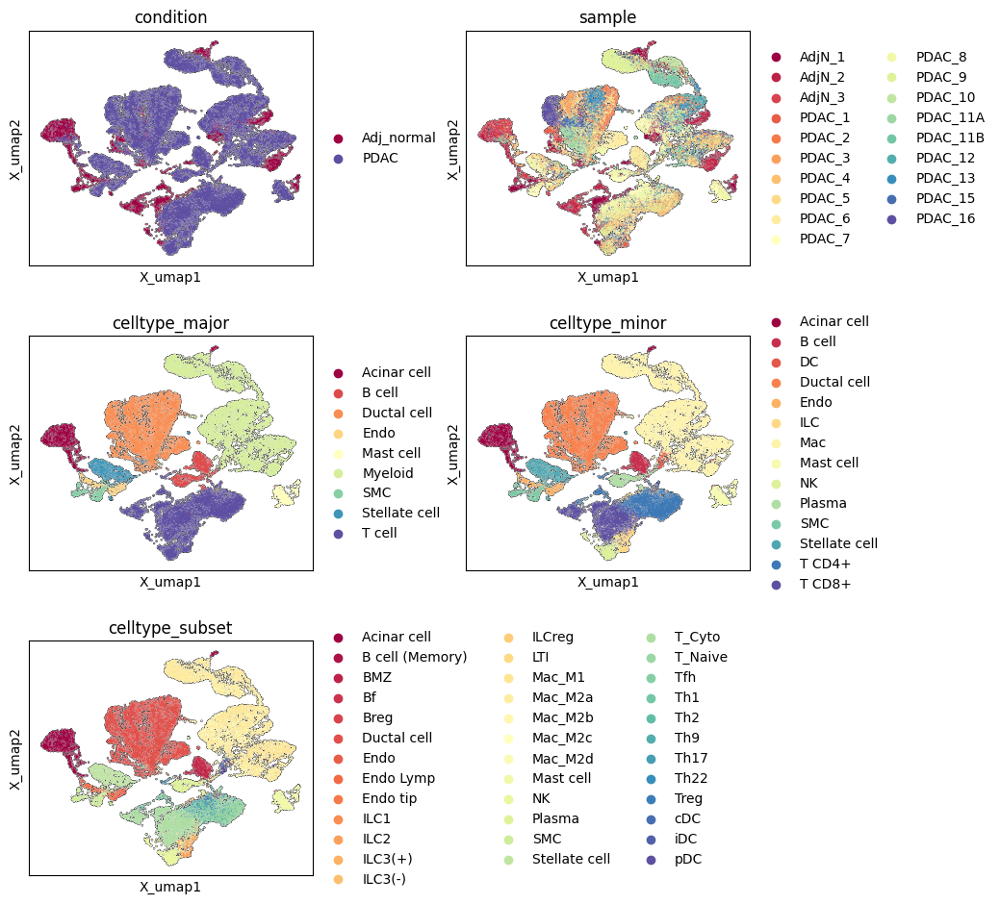

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

## Abbreviate cell names
cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata,
                 basis = 'X_umap',
                 neighbors_key = 'neighbors',
                 color=items_to_plot,
                 wspace = 0.4,
                 hspace = 0.3,
                 legend_fontsize = 10,
                 ncols = 2,
                 palette = 'Spectral',
                 add_outline = True)

#### __A.3 Inspecting minor-type annotation result__

In [ ]:
adata.obs['celltype_minor'].value_counts()

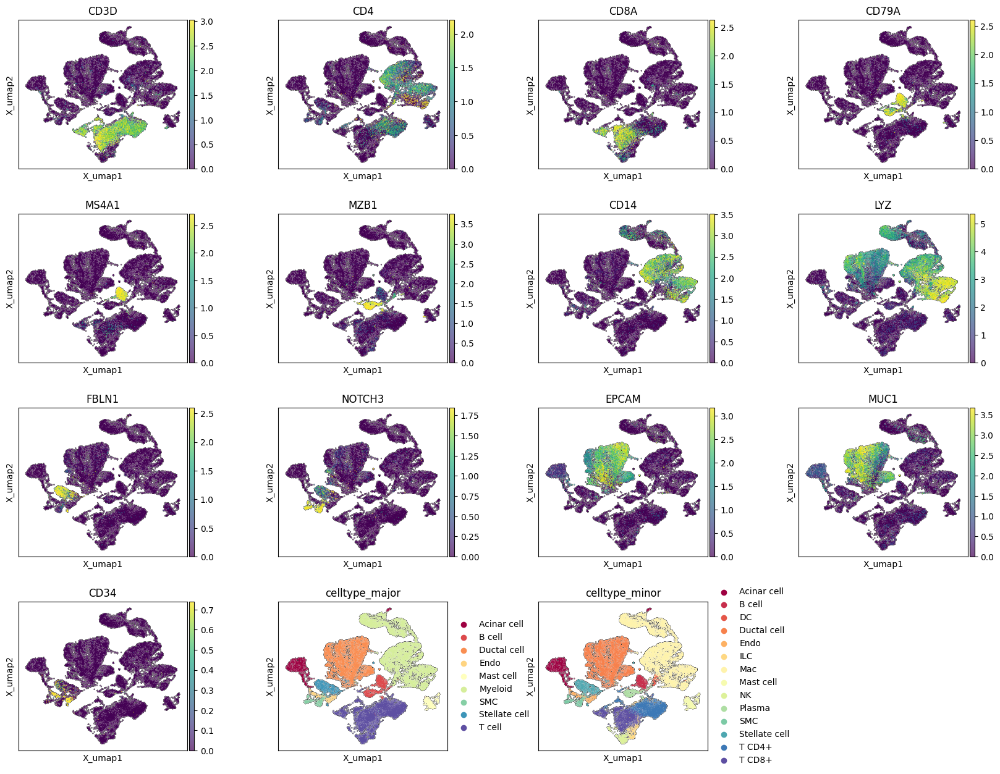

In [ ]:
items_to_plot = ['celltype_major', 'celltype_minor']

if adata_t.uns['usr_param']['species'] == 'human':
    genes = ['CD3D', 'CD4', 'CD8A', 'CD79A', 'MS4A1', 'MZB1',
             'CD14', 'LYZ', 'FBLN1', 'NOTCH3', 'EPCAM', 'MUC1',  'CD34']
else:
    genes = ['Cd3d', 'Cd4', 'Cd8a', 'Cd79a', 'Ms4a1', 'Mzb1',
             'Cd14', 'Lyz', 'Fbln1', 'Notch3', 'Epcam', 'Muc1',  'Cd34']

## 위 목록의 마커 유전자들 중 현재의 데이터에 있는 유전자들만 순서대로 선택
genes_all = list(adata.var.index.values)
items_to_plot = [g for g in genes if g in genes_all] + items_to_plot

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata,
                 basis = 'X_umap',
                 neighbors_key = 'neighbors',
                 color=items_to_plot,
                 wspace = 0.4,
                 hspace = 0.3,
                 legend_fontsize = 10,
                 ncols = 4,
                 palette = 'Spectral',
                 add_outline = True,
                 vmax = 'p99',
                 vmin = 0)

#### __A.4 Subset marker expression profile__
- Subset annotation은 UMAP으로 확인하기 어려우므로 dot plot을 사용하여 확인
- dot의 크기는 annotation 결과 기준으로 해당 유형의 세포 중 얼마나 많은 비율이 해당 유정의 마커 유전자를 발현하고 있는지 보여줌


Num markers selected: 169 -> 120


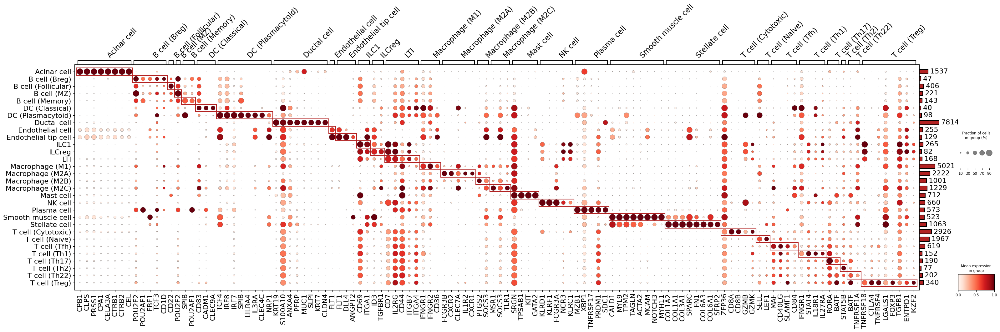

In [ ]:
mkr_dct_selected = plot_marker_exp( adata_t,
                                    markers = None,
                                    N_cells_per_group_min = 30,
                                    N_markers_per_group_max = 8,
                                    N_markers_total = 120,
                                    title = None,
                                    title_y_pos = 1.1,
                                    title_fs = 30,
                                    text_fs = 16,
                                    standard_scale = 'var',
                                    var_group_rotation = 45,
                                    var_group_height = 1.2,
                                    nz_frac_max = 0.9,
                                    nz_frac_cutoff = 0.05,
                                    rem_mkrs_common_in_N_groups_or_more = 3,
                                    figsize = None,
                                    swap_ax = False,
                                    legend = True,
                                    cmap = 'Reds',
                                    linewidth = 1.5,
                                    linecolor = 'firebrick')

#### __Practice:__ Visualizing T-cell subsets

In [ ]:
b = adata_t.obs['celltype_major'] == 'Myeloid cell'
adata = adata_t[b,:].copy()

## UMAP 프로젝션을 얻기 위한 기본적 처리과정
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes = 1000)
try:
    sc.tl.pca(adata, n_comps = 15, mask_var="variable_genes")
except:
    sc.tl.pca(adata, n_comps = 15, use_highly_variable = True)
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=15, use_rep = 'X_pca')
sc.tl.umap(adata)

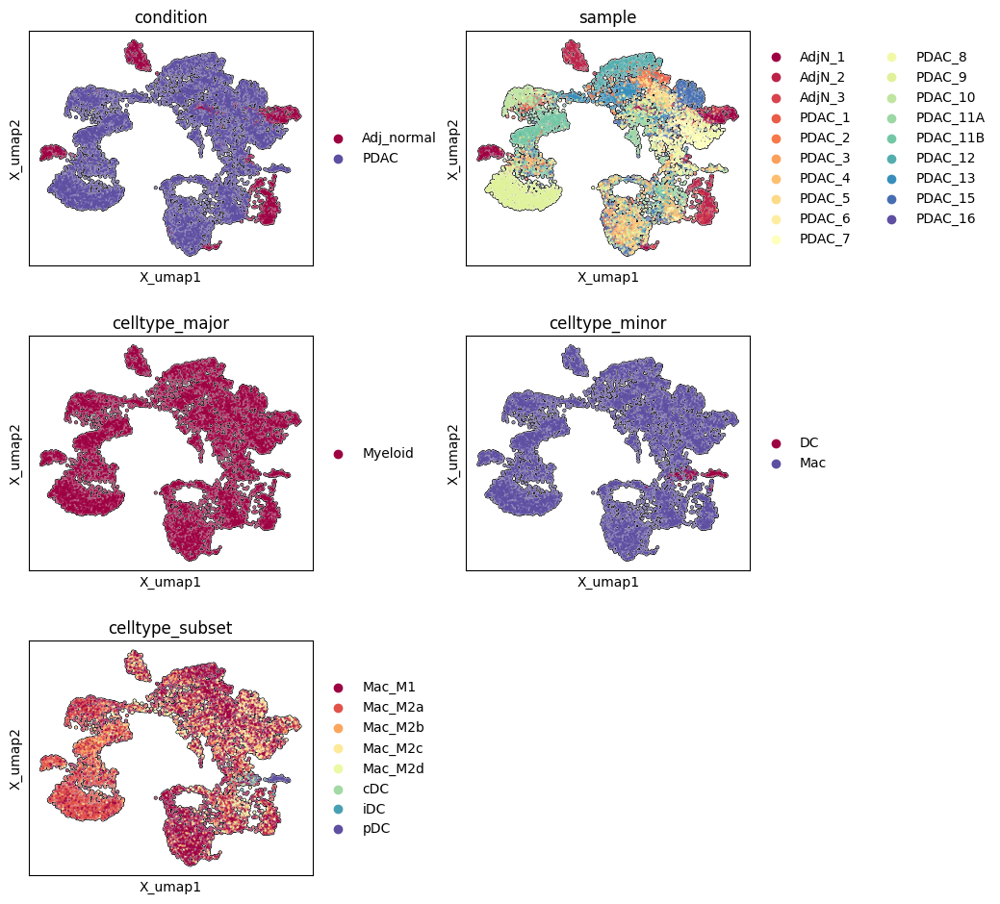

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

items_to_plot = ['condition', 'sample',
                 'celltype_major', 'celltype_minor', 'celltype_subset']

cols = ['celltype_major', 'celltype_minor', 'celltype_subset']
for col in cols:
    adata.obs[col] = adata.obs[col].astype(str)
    adata.obs[col].replace(rename_dict[col], inplace = True)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
sc.pl.embedding( adata,
                 basis = 'X_umap',
                 neighbors_key = 'neighbors',
                 color=items_to_plot,
                 wspace = 0.4,
                 hspace = 0.3,
                 legend_fontsize = 10,
                 ncols = 2,
                 palette = 'Spectral',
                 add_outline = True)

#### __A.5 Inspecting celltype population__


,Group,Acinar cell,B cell,Dendritic cell,Ductal cell,Endothelial cell,ILC,Macrophage,Mast cell,NK cell,Plasma cell,Smooth muscle cell,Stellate cell,T cell CD4+,T cell CD8+
AdjN_1,Adj_normal,8.2,1.8,0.0,12.2,3.9,1.6,28.4,5.1,2.4,0.3,11.2,1.0,2.4,21.6
AdjN_2,Adj_normal,31.6,0.2,0.2,1.2,3.0,0.2,33.8,1.8,2.8,0.0,1.0,0.0,8.0,16.2
AdjN_3,Adj_normal,61.9,0.3,0.1,12.3,6.0,0.1,7.4,0.3,0.6,0.0,0.2,2.6,2.2,6.0
PDAC_1,PDAC,0.2,1.3,0.3,18.4,0.0,18.9,37.9,0.3,3.6,1.5,0.4,0.1,10.7,6.3
PDAC_10,PDAC,0.5,3.3,1.3,6.7,0.1,0.9,38.7,1.0,0.3,1.6,0.2,1.3,27.9,16.1
PDAC_11A,PDAC,0.0,0.2,0.0,59.0,1.0,0.6,30.6,0.0,0.1,0.4,0.1,5.4,2.2,0.4
PDAC_11B,PDAC,0.0,1.8,0.7,6.7,0.3,0.9,70.3,0.4,2.3,0.6,0.7,1.1,12.2,1.9
PDAC_12,PDAC,4.6,0.4,0.9,1.6,0.2,0.8,70.6,0.0,2.6,1.6,0.1,0.0,11.3,5.4
PDAC_13,PDAC,0.0,0.2,0.4,53.9,0.0,1.0,29.7,0.5,1.2,0.0,0.0,0.9,8.2,3.9
PDAC_15,PDAC,0.0,0.6,0.5,20.9,0.3,2.2,41.4,0.4,4.1,1.2,0.1,4.8,15.0,8.4


<Figure size 350x350 with 0 Axes>

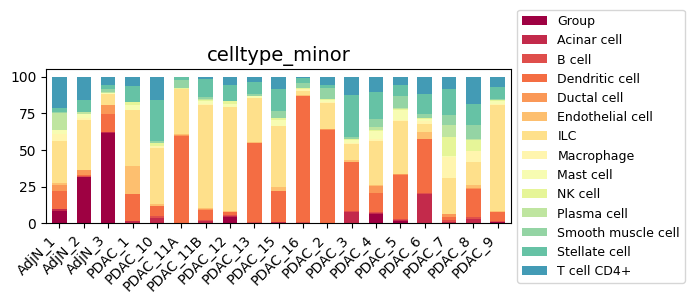

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [] )

## 샘플별 세포 개수 확인
display(df_pct.round(1))

plot_population( df_pct,
                 bar_width = 0.6,
                 title = celltype_col,
                 title_fs = 14,
                 label_fs = 12,
                 tick_fs = 10,
                 xtick_rot = 45,
                 xtick_ha = 'right',
                 legend_fs = 9,
                 legend_loc = 'center left',
                 bbox_to_anchor = (1,0.5),
                 legend_ncol = 1,
                 cmap = None,
                 figsize=(6, 2),
                 dpi = 100)

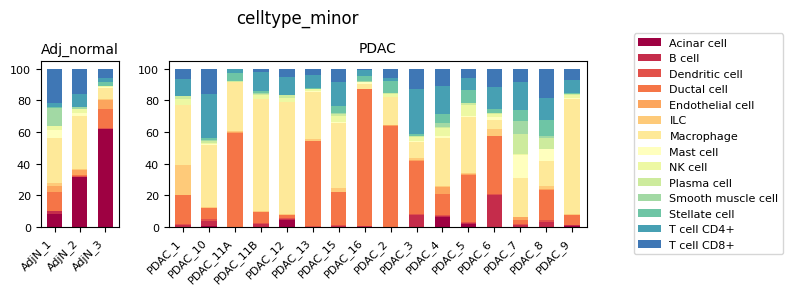

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [], sample_col = 'sample' )

plot_population_grouped( df_pct,
                         sort_by = [],
                         bar_width = 0.6,
                         title = celltype_col,
                         title_fs = 12,
                         title_y_pos = 1.2,
                         label_fs = 10,
                         tick_fs = 8,
                         xtick_rot = 45,
                         xtick_ha = 'right',
                         legend_fs = 8,
                         legend_loc = 'center left',
                         bbox_to_anchor = (1.1,0.5),
                         legend_ncol = 1,
                         cmap = None,
                         figsize=(7, 2),
                         dpi = 100,
                         wspace = 0.2,
                         hspace = 0.2 )

#### __A.6 Inspecting condition-specificity in celltype population__

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
celltype_col = 'celltype_minor' ## 세포 유형의 기준
df_cnt, df_pct= get_population_per_sample( adata_t, celltype_col, sort_by = [], sample_col = 'sample' )

## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

df_res = test_group_diff( df_pct,
                          ref_group = None,
                          pval_cutoff = 0.8 )
display(df_res)

,PDAC_vs_Adj_normal
Dendritic cell,0.000551
Ductal cell,0.015700
T cell CD4+,0.018440
Plasma cell,0.039233
Endothelial cell,0.041687
Stellate cell,0.058119
Acinar cell,0.167312
B cell,0.182535
ILC,0.237443
T cell CD8+,0.272005


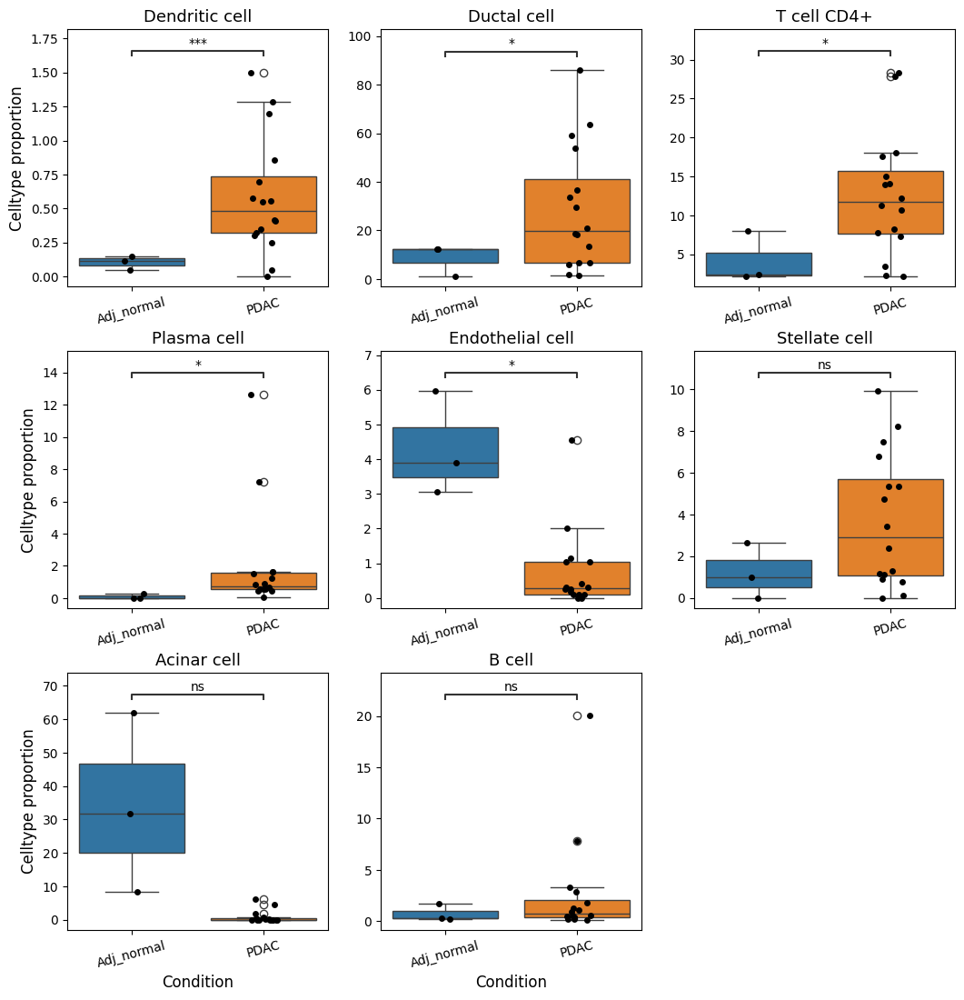

In [ ]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel],
                 df_pct['Group'],
                 ylabel = 'Celltype proportion',
                 ncols = 3,
                 figsize = (3.5,3.5),
                 dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None,
                 title_y_pos = 1.05,
                 title_fs = 15,
                 label_fs = 12,
                 tick_fs = 10,
                 xtick_rot = 15,
                 annot_ref = None,
                 annot_fmt = 'star',
                 annot_fs = 10,
                 ws_hs = (0.2, 0.25),
                 stripplot = True,
                 stripplot_ms = 5,
                 cmap = 'tab10')

#### __Practice: Inspecting subset population__

,Group,Macrophage (M1),Macrophage (M2A),Macrophage (M2B),Macrophage (M2C),Macrophage (M2D)
AdjN_1,Adj_normal,216,146,89,85,32
AdjN_2,Adj_normal,392,73,73,72,65
AdjN_3,Adj_normal,35,12,2,5,11
PDAC_1,PDAC,216,94,37,18,10
PDAC_10,PDAC,219,158,29,38,7
PDAC_11A,PDAC,301,75,61,85,90
PDAC_11B,PDAC,378,407,218,56,51
PDAC_12,PDAC,563,57,107,62,38
PDAC_13,PDAC,340,49,76,78,51
PDAC_15,PDAC,426,73,53,249,28


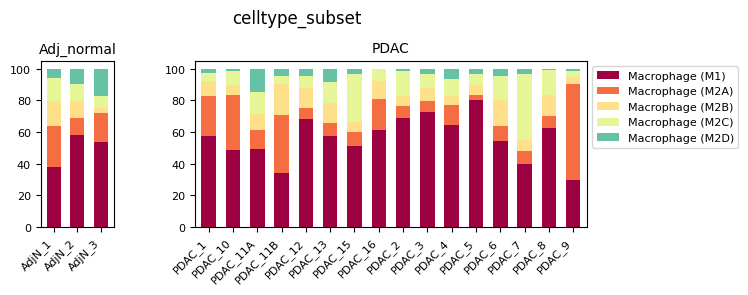

In [ ]:
## 특정 세포유형의 subset별 상대비율을 얻기 위해 특정 세포 유형만 선택
## 이 경우 Macrophage subset의 상대비율을 보기 위해 먼저 minor type이 macrophage인 cell들만 선택
b = adata_t.obs['celltype_minor'] == 'Macrophage'
adata_s = adata_t[b,:]

## 샘플별로 macrophage subset의 개수와 상대비율을 얻어서 데이터프레임에 저장
col = 'celltype_subset'
df_cnt, df_pct= get_population_per_sample( adata_s, col, sort_by = [] )
display(df_cnt)

plot_population_grouped( df_pct,
                        sort_by = [],
                         title = col,
                         title_fs = 12,
                         title_y_pos = 1.2,
                         label_fs = 10,
                         bar_width = 0.6,
                         tick_fs = 8,
                         xtick_rot = 45,
                         xtick_ha = 'right',
                         legend_fs = 8,
                         legend_loc = 'upper left',
                         bbox_to_anchor = (1,1),
                         legend_ncol = 1,
                         cmap = None,
                         figsize=(7, 2),
                         wspace = 0.35,
                         dpi = 100)

In [ ]:
## 요부분은 sample 별 population을 얻어 조건별로 population이 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커짐 (p-value가 작아짐)

df_res = test_group_diff( df_pct, ref_group = None, pval_cutoff = 0.8 )
display(df_res)

,PDAC_vs_Adj_normal
Macrophage (M2D),0.172270
Macrophage (M1),0.430258
Macrophage (M2C),0.550392


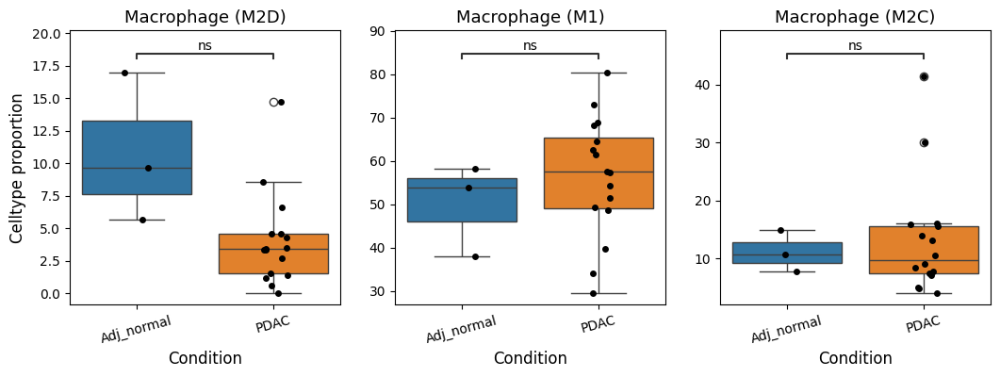

In [ ]:
## 표시할 결과 항목을 선택: 최대 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Show the first 5 CCIs
    plot_pct_box(df_pct[idx_sel],
                 df_pct['Group'],
                 ylabel = 'Celltype proportion',
                 ncols = 3,
                 figsize = (3.5,3.5),
                 dpi = 100,
                 group_order = None, # ['Normal', 'ER+', 'HER2+', 'TNBC'],
                 title = None,
                 title_y_pos = 1.05,
                 title_fs = 15,
                 label_fs = 12,
                 tick_fs = 10,
                 xtick_rot = 15,
                 annot_ref = None,
                 annot_fmt = 'star',
                 annot_fs = 10,
                 ws_hs = (0.2, 0.25),
                 stripplot = True,
                 stripplot_ms = 5,
                 cmap = 'tab10')

### __B. CNV & tumor cell identification 결과__
#### <font color=blue>(This works only if you checked "Tumor cell Identification" box when running SCODA)</font>

- __InferCNV:__ https://github.com/broadinstitute/infercnv
- __InferCNVpy:__ https://infercnvpy.readthedocs.io/en/latest/infercnv.html
- __InferPloidy:__ https://github.com/combio-dku/InferPloidy

#### __B.1 Inspecting CNV estimates using heatmap__
- We first group the cells into appropriate groups
- then compare the CNV patterns of the resulting cell groups using a heatmap.

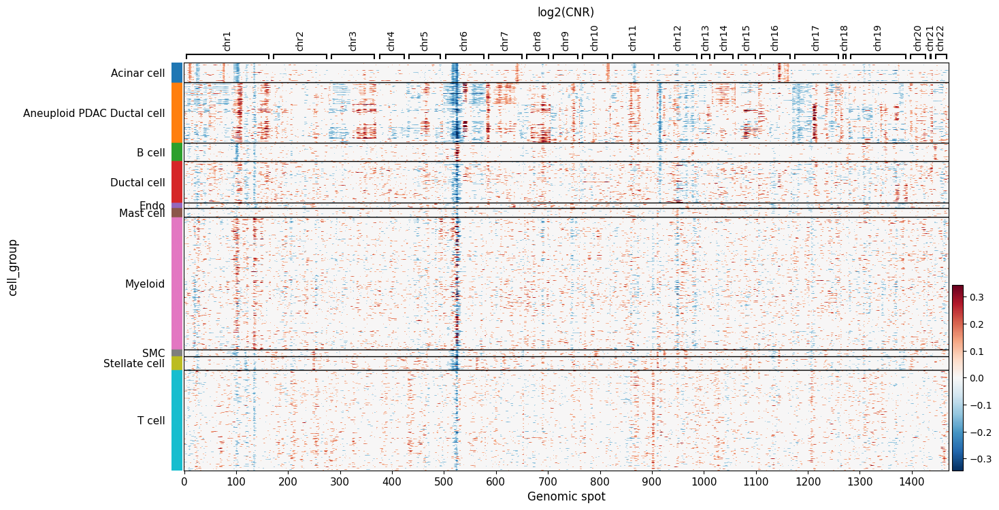

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

## adata_t의 사본을 만들어서 adata에 저장
## 이렇게하면 adata에 대해 처리한 내용이 원본에는 반영되지 않음
adata = adata_t[:,:].copy()

## cell들을 Grouping 하기 위해 obs 필드에 'cell_group' 열을 새로 정의
## 기본적으로 major type의 이름을 사용
adata.obs['cell_group'] = adata.obs['celltype_major'].astype(str).copy(deep = True)
adata.obs['cell_group'] = adata.obs['cell_group'].replace(rename_dict['celltype_major'])

## condition 열에 정의된 유방암 subtype에 따라 암세포로 식별된 세포들의
## 이름에 유방암 subtype을 추가하여 이름 변경
b = adata.obs['ploidy_dec'] == 'Aneuploid'
adata.obs.loc[b, 'cell_group'] = 'Aneuploid ' + adata.obs.loc[b, 'condition'].astype(str) \
                               + ' ' + adata.obs.loc[b, 'cell_group']

## 'cell_group'열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd = plot_cnv( adata,
                groupby = 'cell_group',
                N_cells_min = 200,
                title = 'log2(CNR)',
                title_fs = 12,
                title_y_pos = 1.1,
                label_fs = 12,
                tick_fs = 11,
                figsize = (15, 8),
                swap_axes = False,
                var_group_rotation = 90,
                cmap='RdBu_r',
                vmax = 1,
                cnv_obsm_key = 'X_cnv',
                cnv_uns_key = 'cnv',
                show_ticks = True,
                xlabel = 'Genomic spot',
                xtick_rot = 0,
                xtick_ha = 'center')

#### __B.2 Comparison of CNV patterns across samples using only cells identified as tumor cells__

In [ ]:
adata

AnnData object with n_obs × n_vars = 31244 × 23239
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_ext_for_deg', 'cell_group'
    var: 'gene_id', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'inferploidy_results'
    obsp: 'cnv_neighbor_graph_connectivity', 'cnv_neighbor_graph_distance'

INFO: n_samples_min: 4 -> 2 


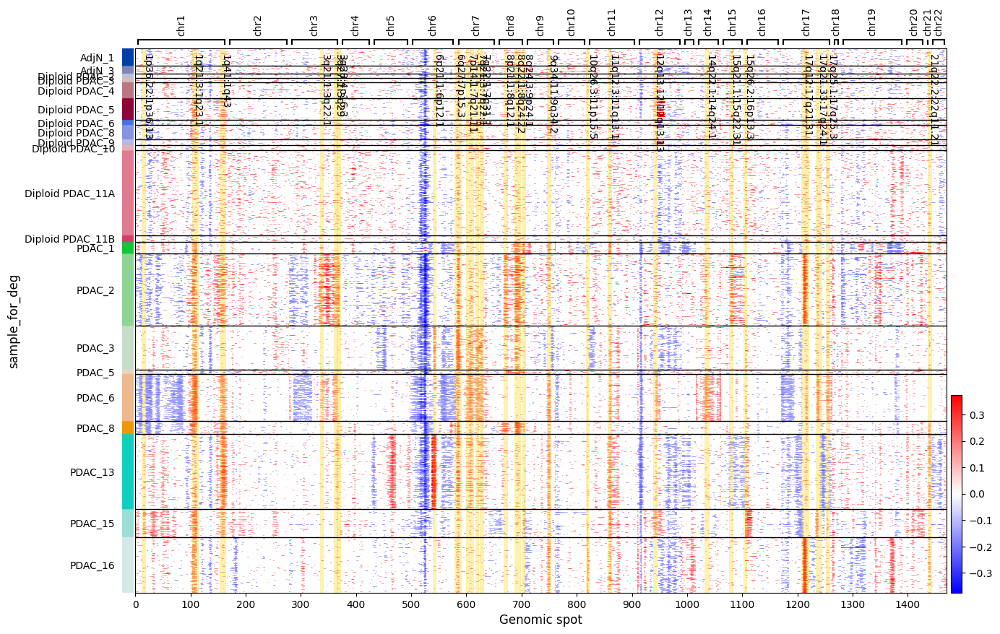

In [ ]:
b = adata.obs['tumor_origin_ind']
adata_s = adata[b,:]

cell_grouping = 'sample_for_deg'

## cell_grouping열 기준으로 Grouping하여 각 그룹별 CNV 패턴을 비교
axd, cna_res = plot_cnv( adata_s,
                         groupby = cell_grouping,
                         N_cells_min = 50,
                         title = None,
                         title_fs = 12,
                         title_y_pos = 1.1,
                         label_fs = 12,
                         tick_fs = 10,
                         Ns_min = 4,
                         show_cna_spots = True,
                         figsize = (15, 10),
                         swap_axes = False,
                         var_group_rotation = 90,
                         cmap='bwr',
                         vmax = 1,
                         cnv_obsm_key = 'X_cnv',
                         cnv_uns_key = 'cnv',
                         show_ticks = True,
                         xlabel = 'Genomic spot',
                         xtick_rot = 0,
                         xtick_ha = 'center')

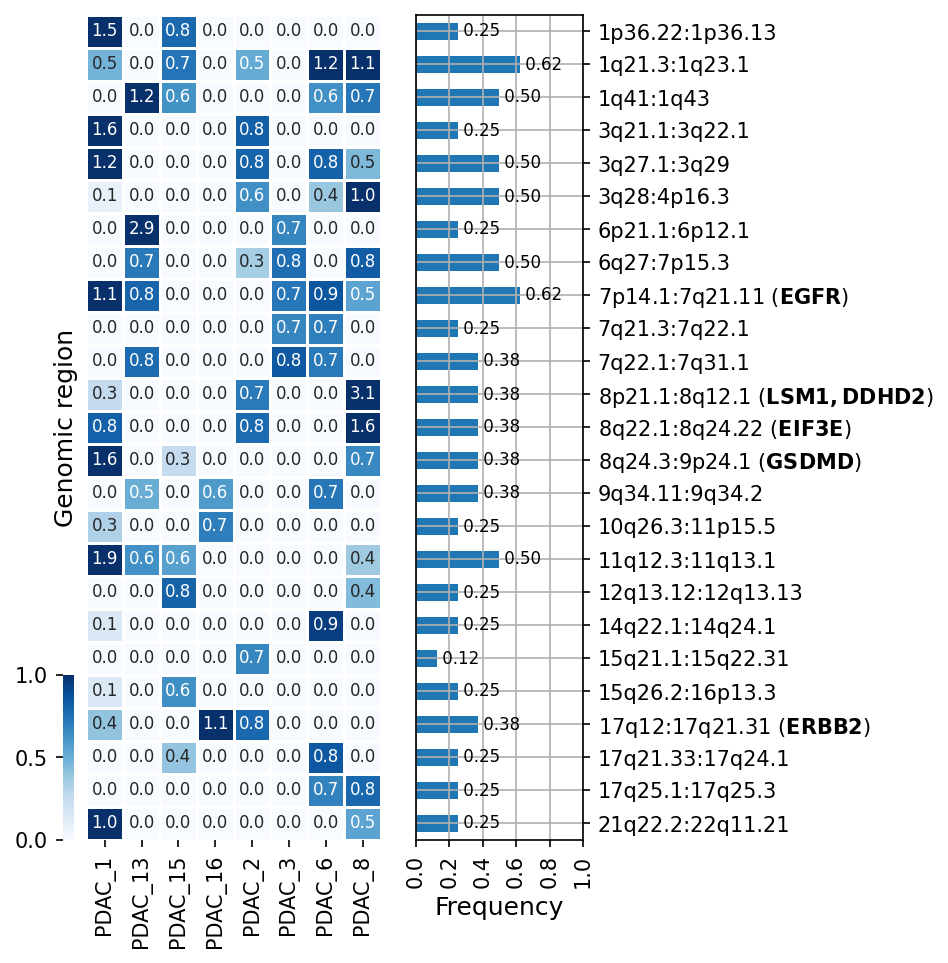

In [ ]:
## uses the retrned value from plot_cnv with show_cna_spots = True
axes = plot_cnv_hit( cna_res,
                     adata_t,
                     title = None,
                     title_fs = 13,
                     label_fs = 12,
                     tick_fs = 10,
                     wspace = 0.1,
                     dpi = 150,
                     ylabel = 'Genomic region',
                     bin_size = 0.22,
                     cmap = 'Blues')

#### __B.3 Check out genomic spots where CNV has a peak__

In [ ]:
cna_res['spots']

{'1p36.22:1p36.13': array([12, 13, 14, 15, 16, 17, 18]),
 '1q21.3:1q23.1': array([103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113]),
 '1q41:1q43': array([153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163]),
 '3q21.1:3q22.1': array([335, 336, 337, 338, 339, 340]),
 '3q27.1:3q29': array([360, 361, 362, 363, 364, 365, 366]),
 '3q28:4p16.3': array([365, 366, 367, 368, 369, 370, 371, 372]),
 '6p21.1:6p12.1': array([539, 540, 541, 542, 543, 544, 545]),
 '6q27:7p15.3': array([579, 580, 581, 582, 583, 584, 585, 586, 587, 588, 589, 590]),
 '7p14.1:7q21.11': array([600, 601, 602, 603, 604, 605, 606, 607, 608, 609, 610, 611, 612]),
 '7q21.3:7q22.1': array([617, 618, 619, 620, 621, 622]),
 '7q22.1:7q31.1': array([624, 625, 626, 627, 628, 629, 630, 631]),
 '8p21.1:8q12.1': array([667, 668, 669, 670, 671, 672, 673, 674]),
 '8q22.1:8q24.22': array([687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697]),
 '8q24.3:9p24.1': array([701, 702, 703, 704, 705, 706, 707]),
 '9q34.11:9q34.2': array(

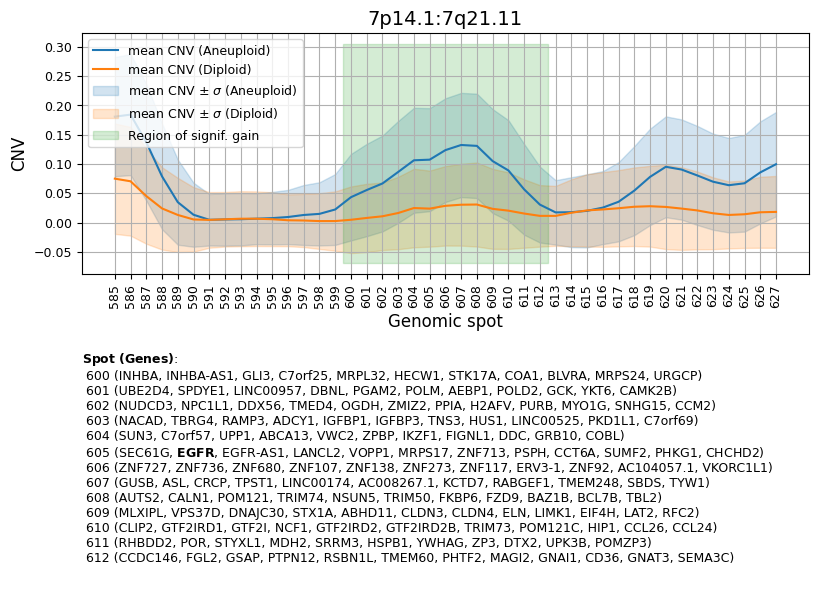

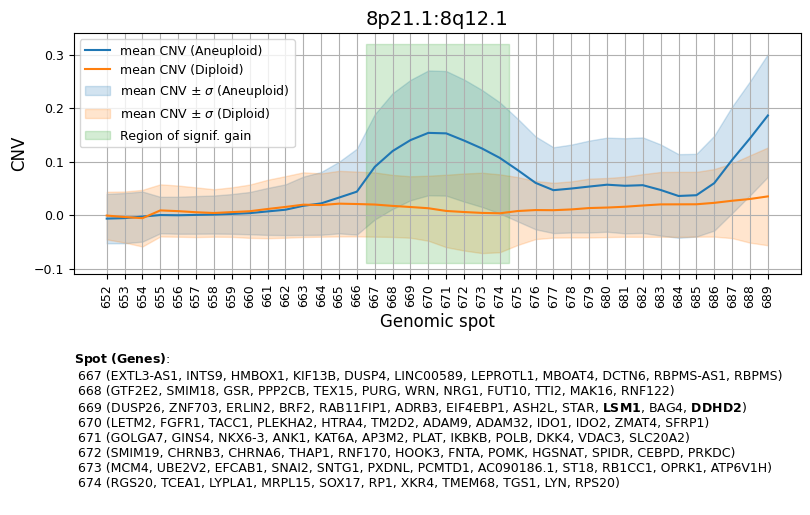

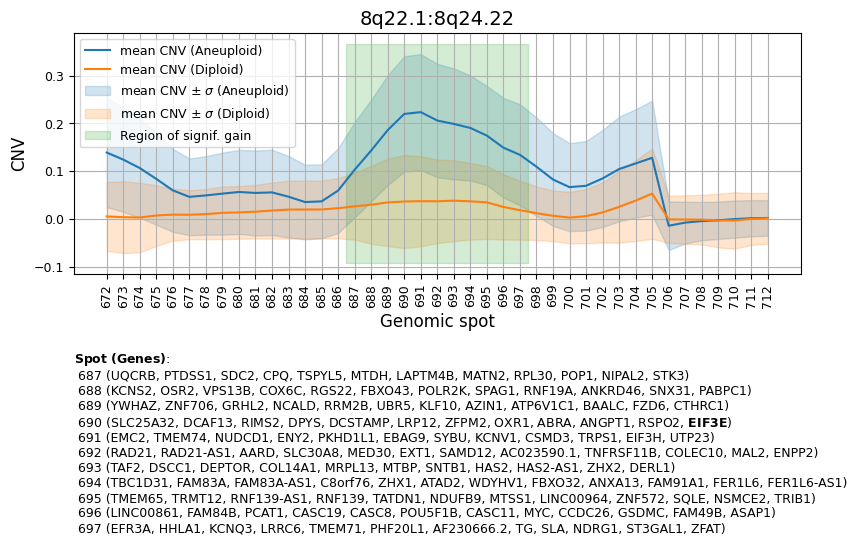

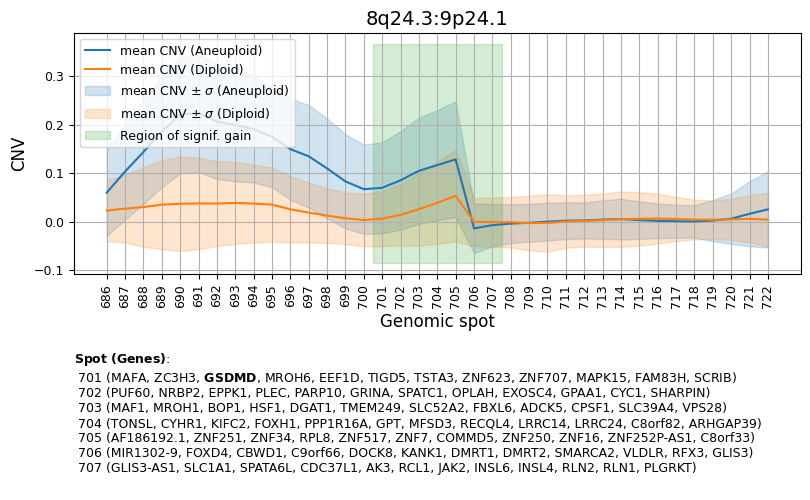

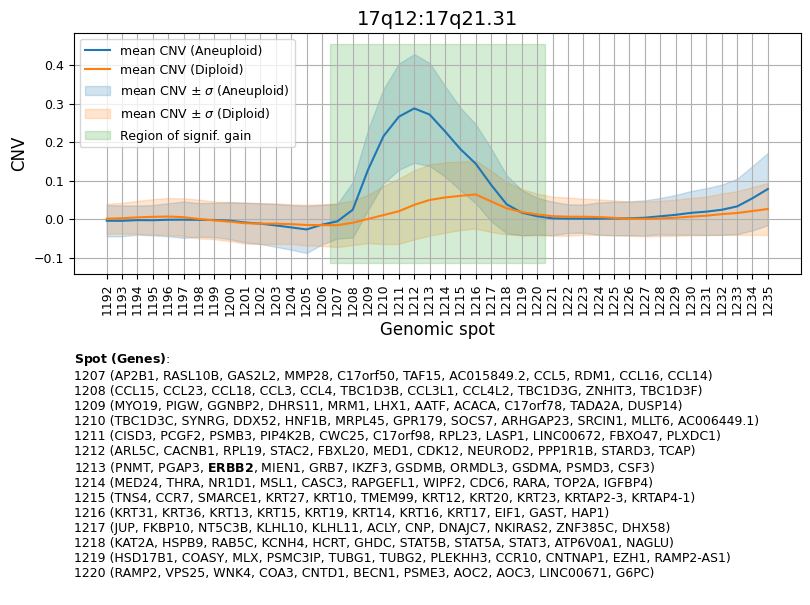

In [ ]:
## Check some Copy Number amplified regions
rngs_dct = get_amp_regions_for_known_markers(adata_s, cna_res['spots'] )

for key in rngs_dct.keys():
    plot_cnv_stat( adata_s,
                   cna_res,
                   key,
                   title = key,
                   title_fs = 14,
                   label_fs = 12,
                   legend_fs = 9,
                   tick_fs = 9,
                   xtick_rot = 90,
                   xtick_ha = 'center',
                   std_scale = 1,
                   figsize = (8,3),
                   ax = None,
                   cmap = 'tab10',
                   grid = True,
                   text_pos_adj = 0.4,
                   rng_ext = 15 )

#### __B.4 Visualizing CNV patterns using UMAP projection__

In [ ]:
adata = adata_t[:,:]

## UMAP projection of X_cnv
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=10, use_rep = 'X_cnv_pca', key_added = 'cnv_neighbors')
ad_tmp = sc.tl.umap(adata, neighbors_key = 'cnv_neighbors', copy = True)
adata.obsm['X_cnv_umap'] = ad_tmp.obsm['X_umap']

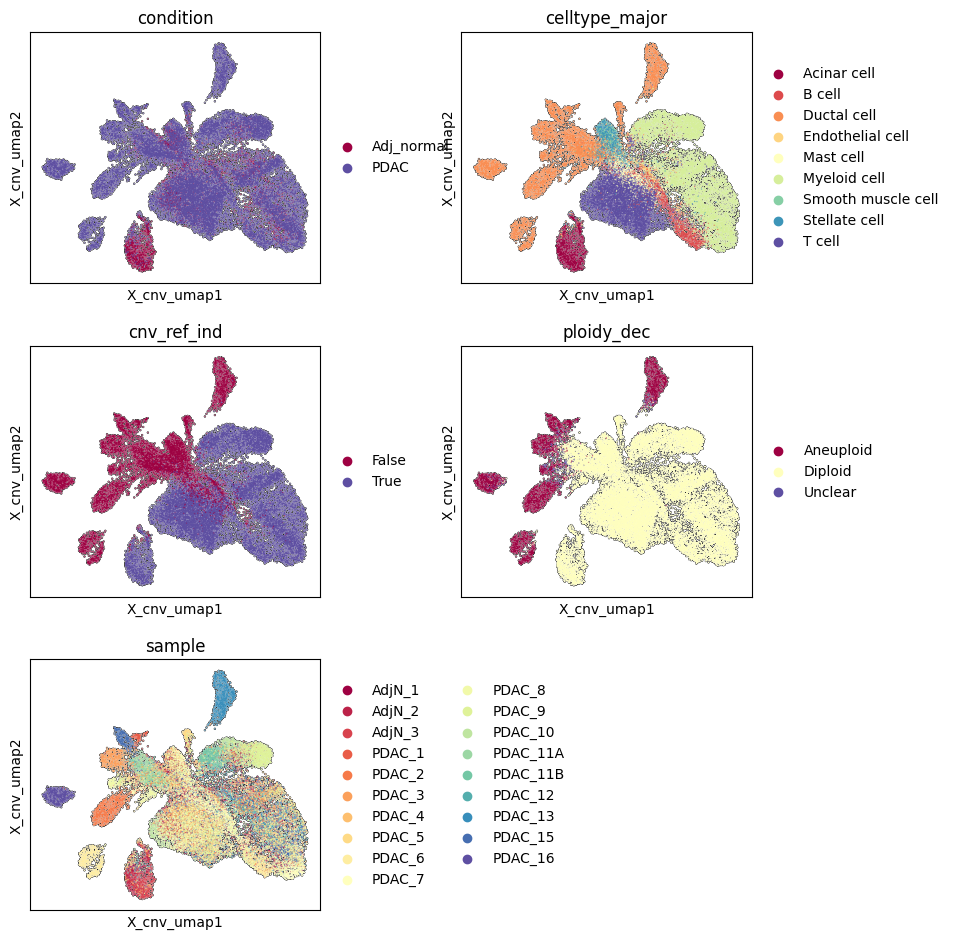

In [ ]:
items_to_plot = ['condition', 'celltype_major', 'cnv_ref_ind', 'ploidy_dec', 'sample']

adata.obs['cnv_ref_ind'] = adata.obs['cnv_ref_ind'].astype(str)
adata.obs['tumor_origin_ind'] = adata.obs['tumor_origin_ind'].astype(str)

plt.rcParams['figure.figsize'] = (3.5, 3.5)
fig = sc.pl.embedding( adata,
                       basis = 'X_cnv_umap',
                       neighbors_key = 'cnv_neighbors',
                       color=items_to_plot,
                       wspace = 0.35,
                       legend_fontsize = 10,
                       ncols = 2,
                       palette = 'Spectral',
                       return_fig = False,
                       add_outline = True)

#### __B.5  Inspecting aneuploid/diploid cell population__

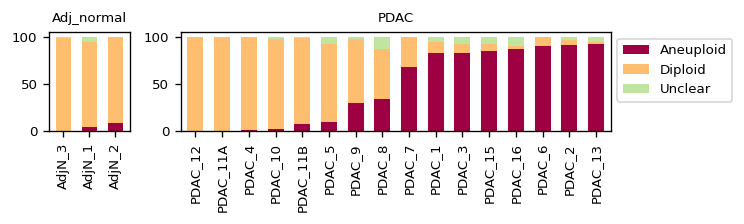

In [ ]:
## 샘플별 세포 개수 및  상대비율을 얻어서 데이터프레임에 저장
b = adata_t.obs['tumor_origin_ind']
adata_s = adata_t[b,:]

col = 'ploidy_dec'
df_cnt, df_pct= get_population_per_sample( adata_s, col, sort_by = [] )

plot_population_grouped( df_pct,
                         sort_by = ['Aneuploid'],
                         bar_width = 0.6,
                         title = None,
                         title_fs = 10,
                         title_y_pos = 1.15,
                         dpi = 120,
                         label_fs = 9,
                         tick_fs = 8,
                         xtick_rot = 90,
                         xtick_ha = 'center',
                         legend_fs = 8,
                         legend_loc = 'upper left',
                         bbox_to_anchor = (1,1),
                         legend_ncol = 1,
                         cmap = None,
                         figsize=(6, 1),
                         wspace = 0.2)

### __C. Cell-cell interaction analysis results__
- __CellPhoneDB:__ https://www.cellphonedb.org/

#### __C.1 Structure and format of the cell–cell interaction results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1091cGa6DqKSybzWSd6YE7amC2HDqNIn6" align="center" width="320"/>
</div>

<div>
<img src=attachment:48abf5fd-8f00-4f14-9a91-bb5b872d7275.png width="320"/>   
</div>

- The CCI results are stored separately for each sample and each condition.
- The data format is consistent between the two result types.
- For condition-level CCI, only interactions that are commonly observed in a certain percentage of samples within the condition are retained.

In [ ]:
show_tree(adata_t.uns['CCI'], max_depth = 3, n_to_show = 3)

Dictionary Structure (top-level):
├── Adj_normal: DataFrame (673, 8), cols=[gene_pair, cell_pair, gene_A, ... ])
└── PDAC      : DataFrame (220, 8), cols=[gene_pair, cell_pair, gene_A, ... ])


In [ ]:
show_tree(adata_t.uns['CCI_sample'], max_depth = 3, n_to_show = 6)

Dictionary Structure (top-level):
├── AdjN_1  : DataFrame (1864, 8), cols=[gene_pair, cell_pair, gene_A, gene_B, cell_A, cell_B, ... ])
├── AdjN_2  : DataFrame (741, 8), cols=[gene_pair, cell_pair, gene_A, gene_B, cell_A, cell_B, ... ])
├── AdjN_3  : DataFrame (569, 8), cols=[gene_pair, cell_pair, gene_A, gene_B, cell_A, cell_B, ... ])
├── PDAC_1  : DataFrame (980, 8), cols=[gene_pair, cell_pair, gene_A, gene_B, cell_A, cell_B, ... ])
├── PDAC_10 : DataFrame (285, 8), cols=[gene_pair, cell_pair, gene_A, gene_B, cell_A, cell_B, ... ])
├── PDAC_11A: DataFrame (138, 8), cols=[gene_pair, cell_pair, gene_A, gene_B, cell_A, cell_B, ... ])
├── PDAC_11B: DataFrame (307, 8), cols=[gene_pair, cell_pair, gene_A, gene_B, cell_A, cell_B, ... ])
├── PDAC_12 : DataFrame (254, 8), cols=[gene_pair, cell_pair, gene_A, gene_B, cell_A, cell_B, ... ])
├── PDAC_13 : DataFrame (455, 8), cols=[gene_pair, cell_pair, gene_A, gene_B, cell_A, cell_B, ... ])
├── PDAC_15 : DataFrame (2974, 8), cols=[gene_pair, cell

In [ ]:
## 샘플 별 CCI 결과
adata_t.uns['CCI_sample'].keys()

dict_keys(['AdjN_1', 'AdjN_2', 'AdjN_3', 'PDAC_1', 'PDAC_10', 'PDAC_11A', 'PDAC_11B', 'PDAC_12', 'PDAC_13', 'PDAC_15', 'PDAC_16', 'PDAC_2', 'PDAC_3', 'PDAC_4', 'PDAC_5', 'PDAC_6', 'PDAC_7', 'PDAC_8', 'PDAC_9'])

In [ ]:
## CCI results in a data frame
adata_t.uns['CCI_sample']['PDAC_9']

,gene_pair,cell_pair,gene_A,gene_B,cell_A,cell_B,pval,mean
CDH1_integrin_a2b1_complex--Diploid Ductal cell|Diploid Ductal cell,CDH1_integrin_a2b1_complex,Diploid Ductal cell|Diploid Ductal cell,CDH1,integrin_a2b1_complex,Diploid Ductal cell,Diploid Ductal cell,0.000,0.366
COL17A1_integrin_a2b1_complex--Diploid Ductal cell|Diploid Ductal cell,COL17A1_integrin_a2b1_complex,Diploid Ductal cell|Diploid Ductal cell,COL17A1,integrin_a2b1_complex,Diploid Ductal cell,Diploid Ductal cell,0.000,0.366
CEACAM1_CEACAM6--Diploid Ductal cell|Diploid Ductal cell,CEACAM1_CEACAM6,Diploid Ductal cell|Diploid Ductal cell,CEACAM1,CEACAM6,Diploid Ductal cell,Diploid Ductal cell,0.000,0.884
CEACAM5_CEACAM6--Diploid Ductal cell|Diploid Ductal cell,CEACAM5_CEACAM6,Diploid Ductal cell|Diploid Ductal cell,CEACAM5,CEACAM6,Diploid Ductal cell,Diploid Ductal cell,0.000,1.529
CEACAM6_CEACAM6--Diploid Ductal cell|Diploid Ductal cell,CEACAM6_CEACAM6,Diploid Ductal cell|Diploid Ductal cell,CEACAM6,CEACAM6,Diploid Ductal cell,Diploid Ductal cell,0.000,1.581
...,...,...,...,...,...,...,...,...
ProstaglandinE2_byPTGES3_PTGER4--T cell CD8+|T cell CD8+,ProstaglandinE2_byPTGES3_PTGER4,T cell CD8+|T cell CD8+,ProstaglandinE2,byPTGES3_PTGER4,T cell CD8+,T cell CD8+,0.000,0.921
SEMA4D_PTPRC--T cell CD8+|T cell CD8+,SEMA4D_PTPRC,T cell CD8+|T cell CD8+,SEMA4D,PTPRC,T cell CD8+,T cell CD8+,0.036,3.534
TGFB1_TGFBR3--T cell CD8+|T cell CD8+,TGFB1_TGFBR3,T cell CD8+|T cell CD8+,TGFB1,TGFBR3,T cell CD8+,T cell CD8+,0.000,1.007
TGFB1_TGFbeta_receptor1--T cell CD8+|T cell CD8+,TGFB1_TGFbeta_receptor1,T cell CD8+|T cell CD8+,TGFB1,TGFbeta_receptor1,T cell CD8+,T cell CD8+,0.000,0.948


In [ ]:
## Condition 별 CCI 결과
adata_t.uns['CCI'].keys()

dict_keys(['Adj_normal', 'PDAC'])

#### __C.2 Inspecting condition-specific CCIs__

4 cell_pairs, 54 gene_pairs found


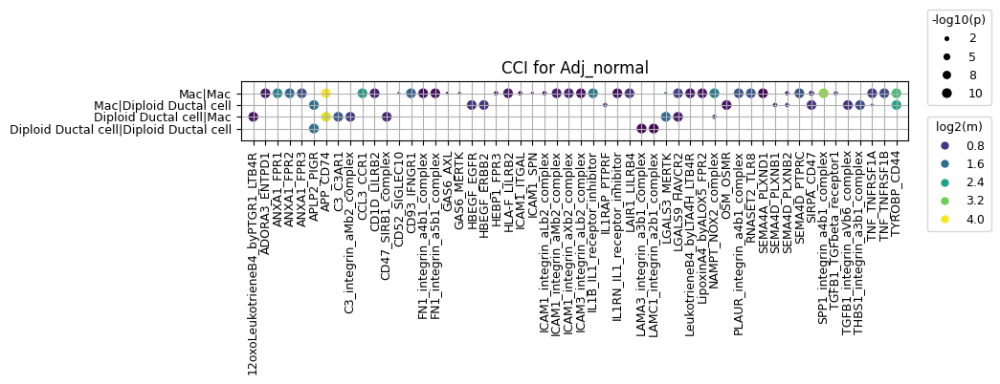

4 cell_pairs, 78 gene_pairs found


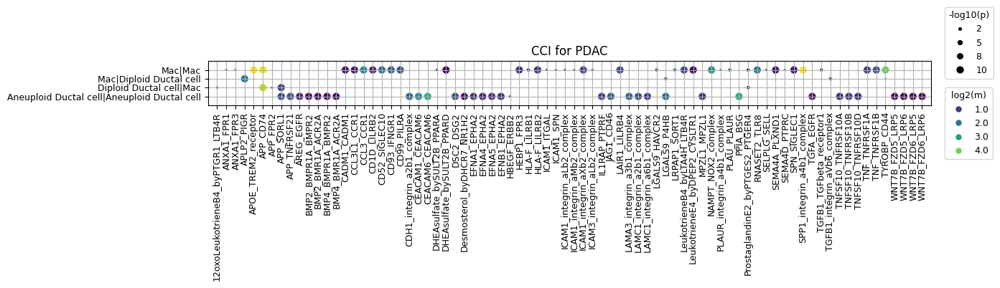

In [ ]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Aneuploid Ductal cell',
                'Diploid Ductal cell',
                'Ductal cell',
                'Macrophage',
                'Fibroblast']
target_genes = []

## Retreive celltype abbreviations
rename_dict = get_abbreviations()

ax = plot_cci_dot( adata_t.uns['CCI'],
                  n_gene_pairs = 100,
                   target_cells = target_cells,
                   target_genes = target_genes,
                   pval_cutoff = 0.1,
                   mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None,
                   title_fs = 12,
                   legend_fs = 9,
                   legend_mkr_sz = 9,
                   tick_fs = 9,
                   xtick_rot = 90,
                   xtick_ha = 'center',
                   dpi = 100,
                   swap_ax = True,
                   cmap = None )

#### __C.3 Exploring CCis associated with a specific gene set__  

In [ ]:
b1 = adata_t.var_names.str.startswith('CCL')
b2 = adata_t.var_names.str.startswith('CXCL')
b3 = adata_t.var_names.str.startswith('IL')

genes_sel = list(adata_t.var.index.values[b1 | b2 | b3])
np.array(genes_sel)

array(['IL22RA1', 'IL23R', 'IL12RB2', 'ILF2', 'IL6R', 'ILDR2', 'IL10',
       'IL19', 'IL20', 'IL24', 'IL1R2', 'IL1R1', 'IL1RL2', 'IL1RL1',
       'IL18R1', 'IL18RAP', 'IL1A', 'IL1B', 'IL37', 'IL36G', 'IL36B',
       'IL36RN', 'IL1RN', 'CCL20', 'ILKAP', 'IL5RA', 'IL17RE', 'IL17RC',
       'IL17RB', 'IL17RD', 'ILDR1', 'IL20RB', 'IL12A-AS1', 'IL12A',
       'IL1RAP', 'IL8', 'CXCL6', 'CXCL1', 'CXCL5', 'CXCL3', 'CXCL2',
       'CXCL9', 'CXCL10', 'CXCL11', 'CXCL13', 'IL2', 'IL21', 'IL15',
       'IL7R', 'CCL28', 'IL31RA', 'IL6ST', 'IL5', 'IL13', 'IL4', 'CXCL14',
       'IL17B', 'IL12B', 'IL17A', 'IL17F', 'IL20RA', 'IL22RA2', 'IL6',
       'CCL26', 'CCL24', 'IL3RA', 'IL1RAPL1', 'IL2RG', 'IL1RAPL2',
       'IL13RA2', 'IL13RA1', 'IL9R', 'IL7', 'IL33', 'IL11RA', 'CCL27',
       'CCL19', 'CCL21', 'IL15RA', 'IL2RA', 'CXCL12', 'ILK', 'IL18BP',
       'IL18', 'IL10RA', 'IL23A', 'IL26', 'IL22', 'IL17D', 'IL25', 'IL16',
       'IL32', 'IL4R', 'IL21R', 'IL21R-AS1', 'IL27', 'CCL22', 'CCL17',
       'IL

In [ ]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Aneuploid Ductal cell',
                'Diploid Ductal cell',
                'Ductal cell',
                'Macrophage',
                'Fibroblast']

## CellPhoneDB는 인간 유전자 이름만 사용하므로 마우스의 경우 유전자 이름을 대문자로 변경 필요.
target_genes = [g.upper() for g in genes_sel]

## Retreive celltype abbreviations
rename_dict = get_abbreviations()

ax = plot_cci_dot( adata_t.uns['CCI'],
                   n_gene_pairs = 60,
                   target_cells = target_cells,
                   target_genes = target_genes,
                   pval_cutoff = 0.1,
                   mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None,
                   title_fs = 12,
                   legend_fs = 9,
                   legend_mkr_sz = 9,
                   tick_fs = 9,
                   xtick_rot = 90,
                   xtick_ha = 'center',
                   dpi = 100,
                   swap_ax = True,
                   cmap = 'Reds')

#### __C.4 Inspecting per-sample CCIs__

In [ ]:
## 특정 target cell이 포함된 interaction들만 확인함. (모든 CCI를 다 보려면 target_cells을 []로 설정)
target_cells = ['Aneuploid Ductal cell',
                'Diploid Ductal cell',
                'Ductal cell', 'Macrophage', 'Fibroblast']
target_genes = []

## Retreive celltype abbreviations
rename_dict = get_abbreviations()

ax = plot_cci_dot( adata_t.uns['CCI_sample'],
                   n_gene_pairs = 60,
                   target_cells = target_cells,
                   target_genes = target_genes,
                   pval_cutoff = 0.1,
                   mean_cutoff = 0.1,
                   rename_cells = rename_dict['celltype_minor'],
                   title = None,
                   title_fs = 12,
                   legend_fs = 9,
                   legend_mkr_sz = 9,
                   tick_fs = 9,
                   xtick_rot = 90,
                   xtick_ha = 'center',
                   dpi = 100,
                   swap_ax = True,
                   cmap = 'Reds')

#### __C.5 Statistical test for condition-specific differences in CCI strength__
샘플별 CCI 결과에서 모든 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [ ]:
target_cells = ['Aneuploid Ductal cell',
                'Diploid Ductal cell',
                'Ductal cell',
                'Macrophage', 'Fibroblast']
target_genes = []

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( adata_t,
                    cci_idx_lst = None,
                    cells = target_cells,
                    genes = target_genes,
                    pval_cutoff = 0.1 )
## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df,
                          ref_group = None,
                          pval_cutoff = 0.05 )
df_res

,PDAC_vs_Adj_normal
ICAM1_ITGAL--Macrophage|T cell CD8+,0.000030
ICAM1_integrin_aLb2_complex--Macrophage|T cell CD8+,0.000030
ICAM3_integrin_aLb2_complex--T cell CD4+|Macrophage,0.000105
ICAM1_SPN--Macrophage|T cell CD8+,0.000176
LTB_LTBR--T cell CD4+|Macrophage,0.000181
...,...
HLA-F_LILRB1--T cell CD4+|Macrophage,0.037066
Cholesterol_byLIPA_RORA--Macrophage|T cell CD8+,0.041485
LGALS3_MERTK--Macrophage|Macrophage,0.043729
LAMA3_integrin_a3b1_complex--Diploid Ductal cell|Diploid Ductal cell,0.044040


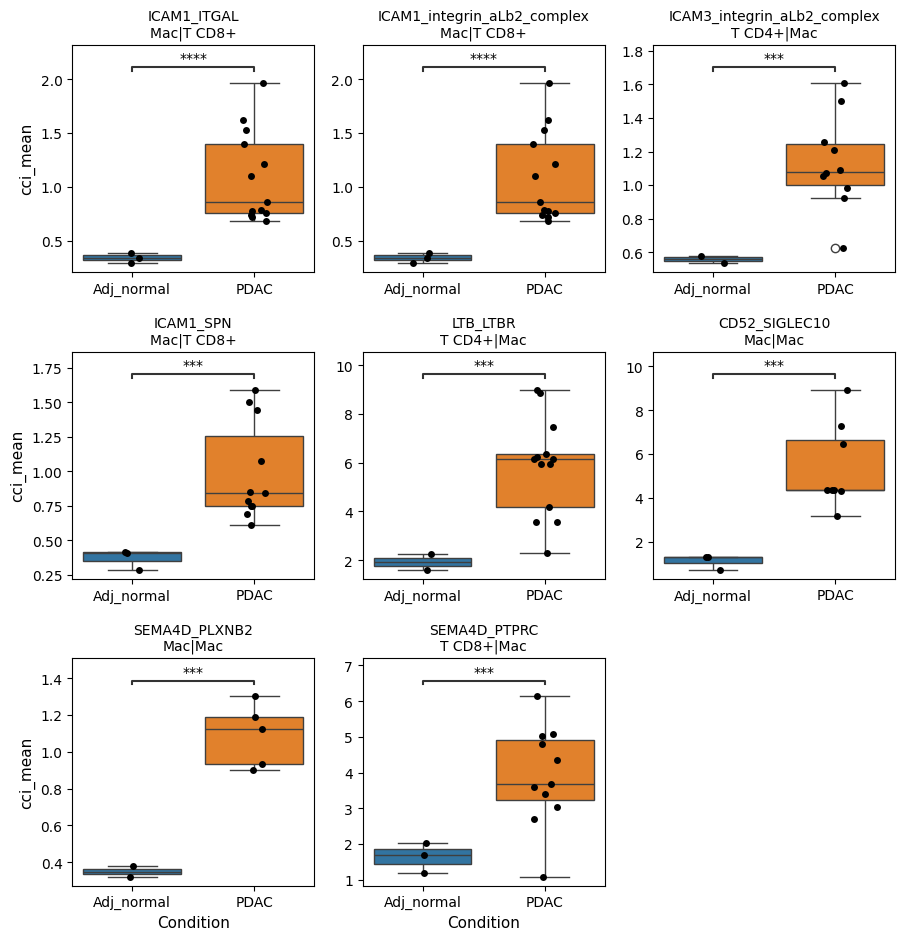

In [ ]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Retreive celltype abbreviations
    rename_dict = get_abbreviations()

    plot_pct_box( df[idx_sel],
                  df['Group'],
                  ylabel = 'cci_mean',
                  ncols = 3,
                  figsize = (3,3),
                  dpi = 100,
                  rename_cells = rename_dict['celltype_minor'],
                  title = None,
                  title_y_pos = 1.05,
                  title_fs = 12,
                  label_fs = 11,
                  tick_fs = 10,
                  xtick_rot = 0,
                  xtick_ha = 'center',
                  annot_ref = None,
                  annot_fmt = 'star',
                  annot_fs = 10,
                  ws_hs = (0.2, 0.35),
                  stripplot = True,
                  stripplot_ms = 5)

#### __C.6 Statistical test for condition-specific differences in CCI strength (specifying genes to consider)__
샘플별 CCI 결과에서 여러 샘플에서 공통적으로 확인된 CCI를 골라서 \
각 조건별로 상호작용의 강도간 유의한 차이가 있는지 확인할 수 있음

In [ ]:
target_cells = ['Aneuploid Ductal cell',
                'Diploid Ductal cell',
                'Ductal cell',
                'Macrophage',
                'Fibroblast']
target_genes = ['EGFR', 'ERBB2', 'MET', 'KRAS', 'TP53']

## mean 값을 가져오된 pval가 cutoff 보다 작은 것들만 가져옴
df = get_cci_means( adata_t,
                    cci_idx_lst = None,
                    cells = target_cells,
                    genes = target_genes,
                    pval_cutoff = 0.1 )

## cci_idx_lst를 None으로 설정하면 cci_df_dct에 있는 모든 CCI들의 union에 대한 결과를 리턴함 (pval_cutoff은 적용됨)
## 리턴 결과가 0인 것은 해당 샘플에서 해당 CCI가 검출되지 않은 것임.

df_res = test_group_diff( df,
                          ref_group = None,
                          pval_cutoff = 0.1,
                          equal_var = True )
df_res

,PDAC_vs_Adj_normal


In [ ]:
## 요부분은 sample 별 CCI의 mean이(CCI의 강도가) 조건별로 유의하게
## 차이가 나는지 확인하는 부분입니다.
## 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고
## sample이 많을 수록 통계적 유의성이 커지고요. (p-value가 작아지고요)

## 표시할 결과 항목을 선택: 앞에서 8개만
max_n_items_to_plot = 8
idx_sel = df_res.index.values.tolist()[:min(max_n_items_to_plot, df_res.shape[0])]

if len(idx_sel) > 0:
    ## Retreive celltype abbreviations
    rename_dict = get_abbreviations()

    plot_pct_box( df[idx_sel],
                  df['Group'],
                  ylabel = 'cci_mean',
                  ncols = 3,
                  figsize = (3,3),
                  dpi = 100,
                  rename_cells = rename_dict['celltype_minor'],
                  title = None,
                  title_y_pos = 1.05,
                  title_fs = 12,
                  label_fs = 11,
                  tick_fs = 10,
                  xtick_rot = 0,
                  xtick_ha = 'center',
                  annot_ref = None,
                  annot_fmt = 'star',
                  annot_fs = 10,
                  ws_hs = (0.2, 0.35),
                  stripplot = True,
                  stripplot_ms = 5)

#### __C.7 Circle plots for an overview of cell-cell interactions__

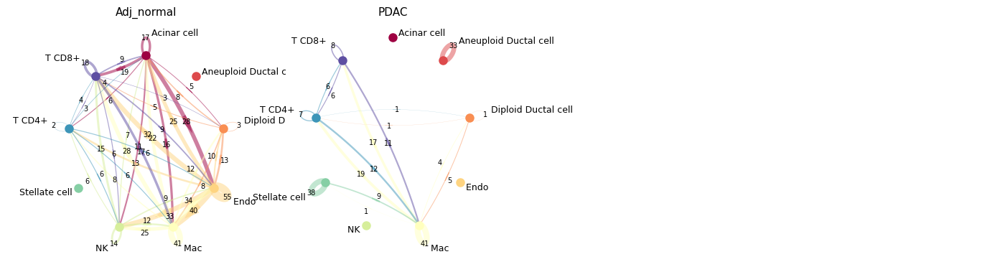

In [ ]:
## Retreive celltype abbreviations
rename_dict = get_abbreviations()

## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
plot_cci_circ_group( adata_t.uns['CCI'],
                     target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False,
                     ncol = 4,
                     figsize = (3.5,3.5),
                     title = None,
                     title_y_pos = 1.1,
                     title_fs = 24,
                     text_fs = 9,
                     num_fs = 7,
                     margin = 0.08,
                     dpi = 100,
                     alpha = 0.5,
                     R_curvature = 3,
                     linewidth_max = 8,
                     linewidth_log = False,
                     node_size = 8,
                     rot = False,
                     cmap = 'Spectral',
                     wspace = 0.15,
                     hspace = 0.1 )

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
plot_cci_circ_group( adata_t.uns['CCI_sample'],
                     target = None,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False,
                     ncol = 4,
                     figsize = (3.5,3.5),
                     title = None,
                     title_y_pos = 1.1,
                     title_fs = 24,
                     text_fs = 9,
                     num_fs = 7,
                     margin = 0.08,
                     dpi = 100,
                     alpha = 0.5,
                     R_curvature = 3,
                     linewidth_max = 8,
                     linewidth_log = False,
                     node_size = 8,
                     rot = False,
                     cmap = 'Spectral',
                     wspace = 0.15,
                     hspace = 0.1 )

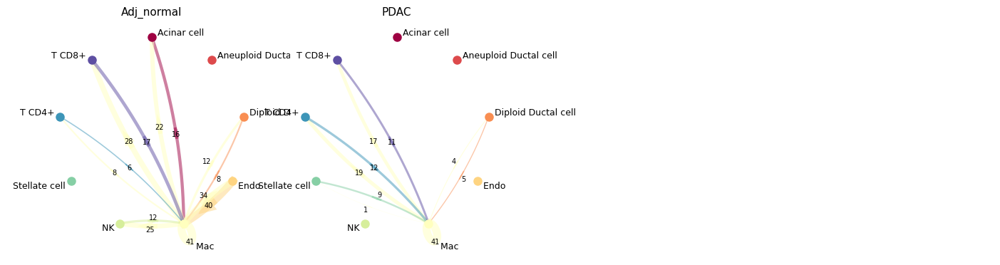

In [ ]:
## DataFrame들의 dictionalry로 되어 있는 CCI 결과를 가져옴
## 특정 세포유형을 중심으로 CCI 개수 확인 (이 경우 Epithelial cell을 중심으로 봄)
target = ['Mac']

plot_cci_circ_group( adata_t.uns['CCI'],
                     target = target,
                     rename_cells = rename_dict['celltype_minor'],
                     remove_common = False,
                     ncol = 4,
                     figsize = (3.5,3.5),
                     title = None,
                     title_y_pos = 1.1,
                     title_fs = 24,
                     text_fs = 9,
                     num_fs = 7,
                     margin = 0.08,
                     dpi = 100,
                     alpha = 0.5,
                     R_curvature = 3,
                     linewidth_max = 8,
                     linewidth_log = False,
                     node_size = 8,
                     rot = False,
                     cmap = 'Spectral',
                     wspace = 0.15,
                     hspace = 0.1 )

### __D. DEG analysis results and marker/target discovery__

In [ ]:
adata_t

NameError: name 'adata_t' is not defined

In [ ]:
nc_deg_dct_of_dct = adata_t.uns['DEG_stat'] ## DEG 분석에 사용된 셀수 정보
df_deg_dct_of_dct = adata_t.uns['DEG'] ## DEG 분석 결과

## 어떤 세포 유형들에 대한 DEG 결과가 있는지 확인
list(df_deg_dct_of_dct.keys())

## analysis_parameters에 정의한 DEG분석을 위한 최소 셀수(MIN_NUM_CELLS_FOR_DEG)보다
## 적은 셀수를 갖는 세포 유형에 대해서는 DEG 분석이 수행 되지 않음.
## (각 조건 별로 해당 유형의 셀수가 최소한 MIN_NUM_CELLS_FOR_DEG 정도되어야 DEG 분석이 수행됨)

['Acinar cell',
 'Diploid Ductal cell',
 'Ductal cell',
 'Endothelial cell',
 'Macrophage',
 'Mast cell',
 'NK cell',
 'Smooth muscle cell',
 'T cell CD4+',
 'T cell CD8+']

#### __D.1 Structure and format of the DEG results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1N-XeRpAvUAlnuryLpll7sYyzGbKGK5eG" align="center" width="500"/>
</div>

<div>
<img src=attachment:f57fafbd-8253-4210-88ed-9acbc3224d08.png width="500"/>   
</div>

- The DEG results are processed and stored separately for each cell type.
- The cell type level to be used—major, minor, or subset—can be specified in the analysis_parameters when running SCODA.
- The current results are based on the celltype_minor level and reflect condition-specific DEGs identified for each cell type.

In [ ]:
## 어떤 세포 유형들에 대한 DEG 결과가 있는지 확인
adata_t.uns['DEG'].keys()

## analysis_parameters에 정의한 DEG분석을 위한 최소 셀수(MIN_NUM_CELLS_FOR_DEG)보다
## 적은 셀수를 갖는 세포 유형에 대해서는 DEG 분석이 수행 되지 않음.
## (각 조건 별로 해당 유형의 셀수가 최소한 MIN_NUM_CELLS_FOR_DEG 정도되어야 DEG 분석이 수행됨)

dict_keys(['Acinar cell', 'Diploid Ductal cell', 'Ductal cell', 'Endothelial cell', 'Macrophage', 'Mast cell', 'NK cell', 'Smooth muscle cell', 'T cell CD4+', 'T cell CD8+'])

In [ ]:
## Ductal cell에 대한 DEG 결과에 어떤 것들이 있는지 확인
adata_t.uns['DEG']['Ductal cell'].keys()

dict_keys(['Adj_normal_vs_others', 'Diploid_vs_others', 'PDAC_vs_others'])

In [ ]:
adata_t.uns['DEG']['Ductal cell']['PDAC_vs_others'].head()

,log2_FC,pval,pval_adj,mean_test,mean_ref,nz_pct_test,nz_pct_ref,nz_pct_score,nz_pct_pval,gene,Rp
gene_name,,,,,,,,,,,
RP11-350J20.12,4.003,7.149816e-98,9.158914e-94,0.991763,0.100531,0.675047,0.157514,0.479136,1.992112e-97,RP11-350J20.12,0.933
EMP1,3.101,2.043049e-56,2.617146e-52,0.736362,0.119416,0.633564,0.148121,0.459775,1.375956e-81,EMP1,0.867
MBOAT2,2.579,3.545966e-54,4.542382e-50,0.826020,0.194727,0.693275,0.187139,0.458077,4.541776e-78,MBOAT2,0.933
KCNN4,2.431,8.640715e-43,1.106876e-38,0.750336,0.188306,0.657448,0.169798,0.453137,2.404632e-81,KCNN4,0.867
PLAUR,2.358,3.442155e-43,4.409401e-39,1.220485,0.382456,0.791326,0.249277,0.445979,1.470256e-108,PLAUR,0.867


- nz_pct_score = nz_pct_test*(1-nz_pct_ref)
- nz_pct_test: percentage of cells with the gene expressed in test group
- nz_pct_ref: percentage of cells with the gene expressed in reference group

In [ ]:
adata_t.uns['DEG_stat']['Ductal cell']

{'Adj_normal_vs_others': {'Adj_normal': 328, 'others': 2975},
 'Diploid_vs_others': {'Diploid': 1384, 'others': 1919},
 'PDAC_vs_others': {'PDAC': 1591, 'others': 1712}}

#### __D.2 Gene ranking per celltype__

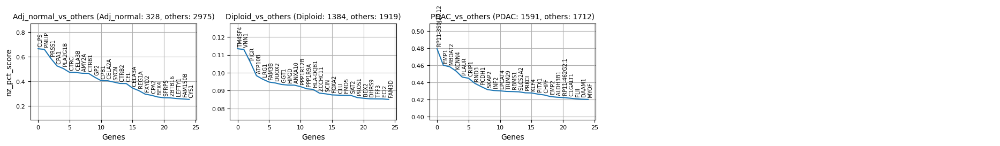

In [ ]:
target_cell = 'Ductal cell'

n_genes_to_show = 25

plot_deg( adata_t.uns['DEG'][target_cell],
          reference = 'nz_pct_score',
          n_genes_to_show = n_genes_to_show,
          pval_cutoff = 0.01,
          figsize = (4,2),
          dpi = 100,
          text_fs = 7,
          title_fs = 10,
          label_fs = 10,
          tick_fs = 8,
          ncols = 5,
          wspace = 0.2,
          hspace = 0.5,
          deg_stat_dct = adata_t.uns['DEG_stat'][target_cell],
          show_log_pv = False )


Acinar cell


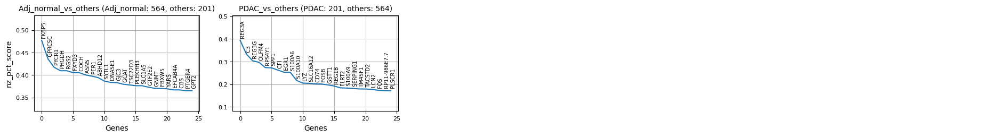

Diploid Ductal cell


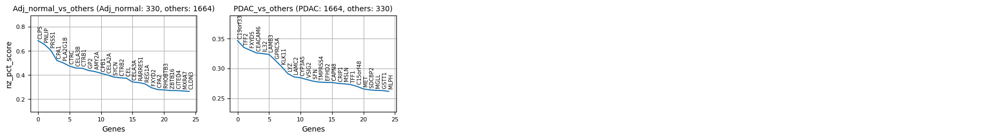

Ductal cell


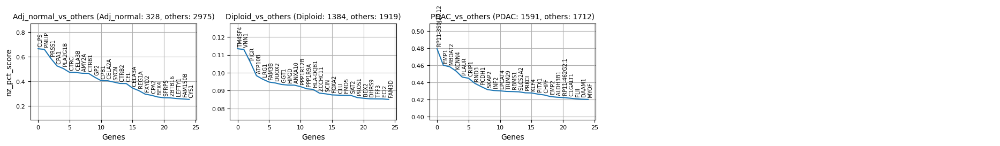

Endothelial cell


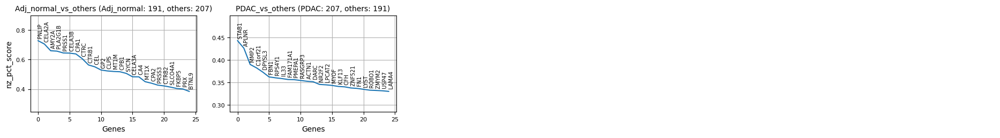

Macrophage


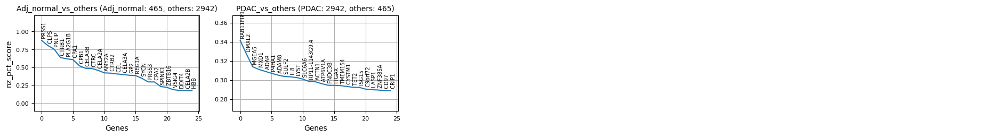

Mast cell


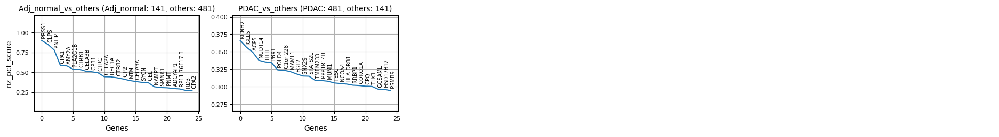

NK cell


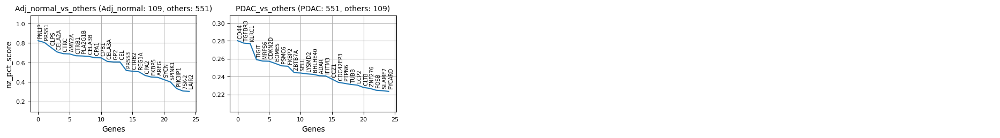

Smooth muscle cell


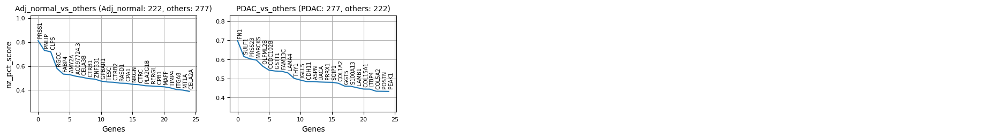

T cell CD4+


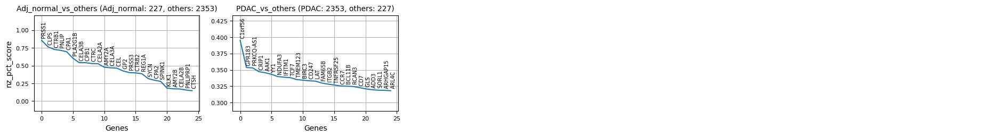

T cell CD8+


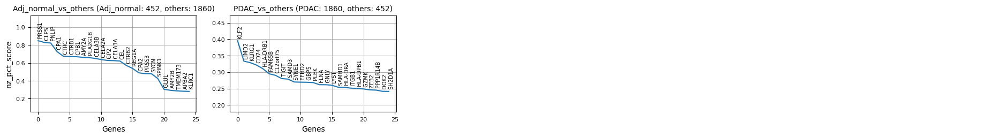

In [ ]:
n_genes_to_show = 25

for key in adata_t.uns['DEG'].keys():

    print(key)
    plot_deg( adata_t.uns['DEG'][key],
              reference = 'nz_pct_score',
              n_genes_to_show = n_genes_to_show,
              pval_cutoff = 0.01,
              figsize = (4,2),
              dpi = 100,
              text_fs = 7,
              title_fs = 10,
              label_fs = 10,
              tick_fs = 8,
              ncols = 5,
              wspace = 0.2,
              hspace = 0.5,
              deg_stat_dct = adata_t.uns['DEG_stat'][key],
              show_log_pv = False )


#### __D.3 Discovery of condition-specific markers (per-celltype)__

In [ ]:
# target_cell = 'Fibroblast'
# target_cell = 'Macrophage'
# target_cell = 'Ductal cell'
target_cell = 'Ductal cell'

mkr_dict, df_deg_dct_updated = find_condition_specific_markers(
                                            adata_t.uns['DEG'][target_cell],
                                            score_col = 'nz_pct_score',
                                            n_markers_max = 50,
                                            score_cutoff = 0.15,
                                            pval_cutoff = 0.05,
                                            nz_pct_fc_cutoff = 1.25,
                                            surfaceome_only = True,
                                            verbose = True )

## Print results
for key in mkr_dict.keys():
    mkr_dict[key].sort()
    print('%s (%i): ' % (key, len(mkr_dict[key])), mkr_dict[key])


N_markers: 
   Adj_normal_vs_others (10897 -> 23) 
   Diploid_vs_others (10579 -> 0) 
   PDAC_vs_others (12488 -> 537)
N_markers_selected: Adj_normal (23), Diploid (0), PDAC (50)
Adj_normal (23):  ['ADRA2A', 'AQP1', 'CA4', 'CADM1', 'FGFR2', 'FGFR3', 'FGFR4', 'FLRT2', 'GGT1', 'GJA1', 'GP2', 'GYPC', 'HEG1', 'HLA-DPB1', 'MUC15', 'NTRK2', 'PCDH9', 'PKHD1', 'SCTR', 'SDC2', 'SGCE', 'SLC3A1', 'SLC4A4']
Diploid (0):  []
PDAC (50):  ['ADAM10', 'ADAM15', 'ADAM17', 'AMN', 'ATP1B3', 'ATP2B4', 'BMPR2', 'CD82', 'CDCP1', 'CLDND1', 'CLSTN1', 'EFNA5', 'EFNB1', 'EFNB2', 'EMP1', 'EMP2', 'EPHA2', 'ERBB2', 'F11R', 'F3', 'HLA-F', 'ITGA3', 'ITGB5', 'LTBR', 'MET', 'MPZL1', 'MST1R', 'MYOF', 'PAM', 'PCDH1', 'PLAUR', 'PRSS8', 'PSEN1', 'PTPRA', 'SCNN1A', 'SEZ6L2', 'SLC2A1', 'SLC39A10', 'SLC52A2', 'TCIRG1', 'TM9SF2', 'TMCO3', 'TMEM63B', 'TMEM87B', 'TNFRSF21', 'TSPAN15', 'UBAC2', 'UNC93B1', 'VSIG2', 'ZDHHC5']


Num markers selected: 63 -> 63


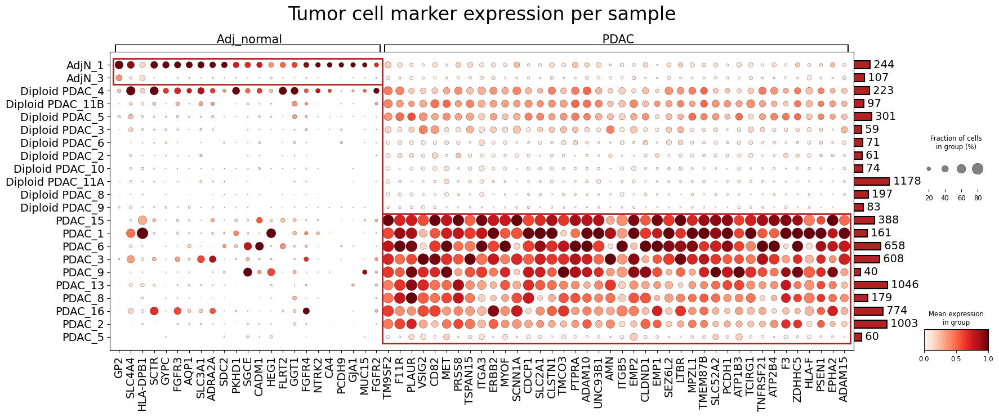

In [ ]:
mkr_dict_updated = plot_marker_exp( adata_t,
                                    markers = mkr_dict,
                                    celltype_selection = 'Tumor cell',
                                    N_cells_per_group_min = 40,
                                    N_markers_per_group_max = 40,
                                    N_markers_total = 140,
                                    title = 'Tumor cell marker expression per sample',
                                    title_y_pos = 2,
                                    title_fs = 24,
                                    text_fs = 14,
                                    var_group_height = 1.2,
                                    var_group_rotation = 0,
                                    standard_scale = 'var',
                                    nz_frac_max = 0.8,
                                    nz_frac_cutoff = 0.05,
                                    rem_mkrs_common_in_N_groups_or_more = 3,
                                    legend = True,
                                    figsize = None,
                                    swap_ax = False,
                                    add_rect = True,
                                    cmap = 'Reds',
                                    linewidth = 2,
                                    linecolor = 'firebrick' )

Num markers selected: 305 -> 120


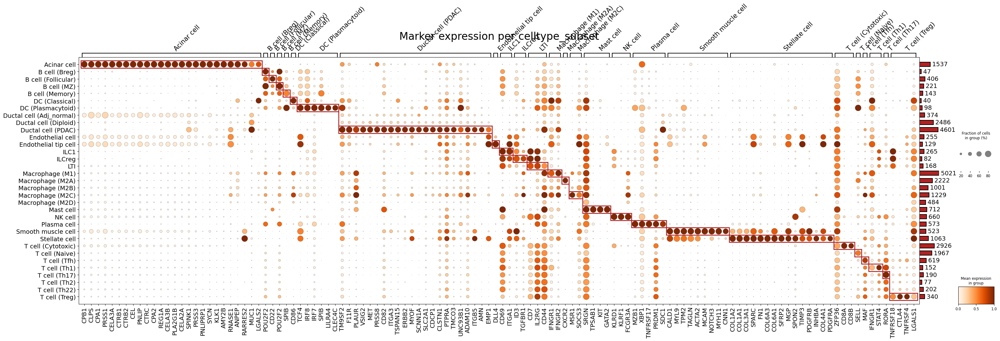

In [ ]:
## Works Only when Tumor cell identification was done.
subset_markers_dict = add_to_subset_markers( adata_t,
                                             mkr_dict,
                                             obs_col_to_add = 'celltype_subset_rev')

subset_markers_dict_updated = plot_marker_exp( adata_t,
                                              markers = subset_markers_dict,
                                              celltype_selection = None,
                                              var_group_col = 'celltype_subset_rev',
                                              cell_group_col = 'celltype_subset_rev',
                                              N_cells_per_group_min = 40,
                                              N_markers_per_group_max = 50,
                                              N_markers_total = 120,
                                              title = 'Marker expression per celltype_subset',
                                              title_y_pos = 2,
                                              title_fs = 24,
                                              text_fs = 14,
                                              var_group_height = 1.2,
                                              var_group_rotation = 45,
                                              standard_scale = 'var',
                                              nz_frac_max = 0.8,
                                              nz_frac_cutoff = 0.05,
                                              rem_mkrs_common_in_N_groups_or_more = 3,
                                              legend = True,
                                              figsize = None,
                                              swap_ax = False,
                                              add_rect = True,
                                              cmap = 'Oranges',
                                              linewidth = 2,
                                              linecolor = 'firebrick' )

#### __D.4 Examining expression patterns of selected markers using violin plots__

In [ ]:
adata_t.obs['celltype_for_cci'].value_counts()

,count
celltype_for_cci,
Macrophage,9957
Aneuploid Ductal cell,4608
T cell CD4+,3581
Diploid Ductal cell,3213
T cell CD8+,2926
Acinar cell,1537
Stellate cell,1056
B cell,817
Mast cell,712


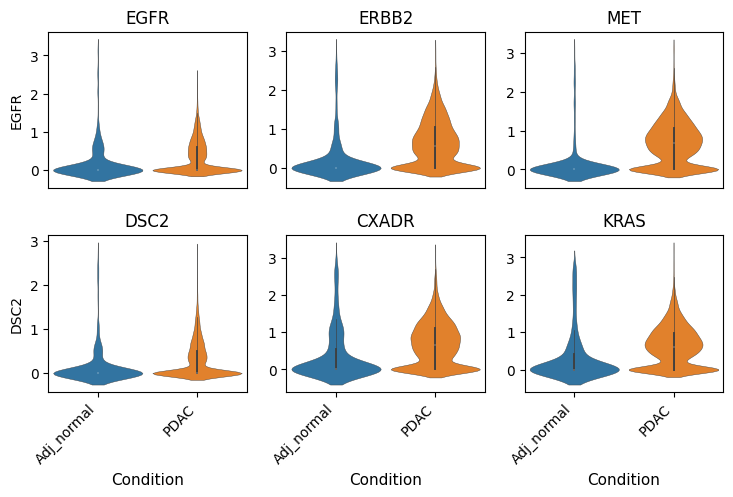

In [ ]:
items_to_plot = ['EGFR', 'ERBB2', 'MET', 'DSC2', 'CXADR', 'KRAS']

# b = adata_t.obs['celltype_major'] == 'Epithelial cell'
b1 = (adata_t.obs['celltype_for_cci'] == 'Aneuploid Ductal cell')
b2 = (adata_t.obs['celltype_for_cci'] == 'Diploid Ductal cell') & (adata_t.obs['condition'] == 'Adj_normal')
b = b1 | b2

adata_s = adata_t[b,:]

## RNA Expression의 log변환 값을 기준으로 violin plot을 확인
sc.pp.normalize_total(adata_s, target_sum=1e4)
sc.pp.log1p(adata_s)

df = adata_s[:, items_to_plot].to_df()
df['group'] = adata_s.obs['condition']

plot_violin( df,
             genes_lst = items_to_plot,
             group_col = 'group',
             scale = 'width',
             group_order = None,
             inner = 'box',
             width = 0.9,
             linewidth = 0.3,
             bw = 'scott',
             figsize = (2.5,2),
             dpi = 100,
             text_fs = 10,
             title = None,
             title_fs = 14,
             title_y_pos = 1,
             label_fs = 11,
             tick_fs = 10,
             xtick_rot = 45,
             xtick_ha = 'right',
             ncols = 3,
             wspace = 0.2,
             hspace = 0.3,
             cmap = 'tab10' )

#### __D.5 Statistical test for mean-expression of condition-specific markers__
- 요부분은 sample 별 Gene expression의 평균이 조건별로 유의하게 차이가 나는지 확인하는 부분입니다. (위 코드셀의 결과가 사용됩니다)
- 따라서, condition 당 sample이 최소 2개 이상 있는 경우 결과가 나오고 sample이 많을 수록 통계적 유의성이 커짐. (p-value가 작아짐)

In [ ]:
b1 = (adata_t.obs['celltype_for_cci'] == 'Aneuploid Ductal cell')
b2 = (adata_t.obs['celltype_for_cci'] == 'Diploid Ductal cell') & (adata_t.obs['condition'] == 'Adj_normal')
b = b1 | b2

adata_s = adata_t[b,:]

df_all = get_gene_expression_mean( adata_s,
                                   genes = [],
                                   group_col = 'sample',
                                   nz_pct = True )
df_res = test_group_diff( df_all,
                         ref_group = None,
                          pval_cutoff = 0.001 )

with pd.option_context('display.max_rows', 20, 'display.min_rows', 20):
    display(df_res)

,PDAC_vs_Adj_normal
RPS19,8.715288e-11
PRSS1,2.645276e-09
MGLL,4.952915e-09
C19orf33,2.774836e-08
BAIAP2L1,1.025928e-07
FXYD5,1.060210e-07
FHL2,1.302799e-07
PRDX1,3.215582e-07
ERO1L,4.193365e-07
EFHD2,4.819002e-07


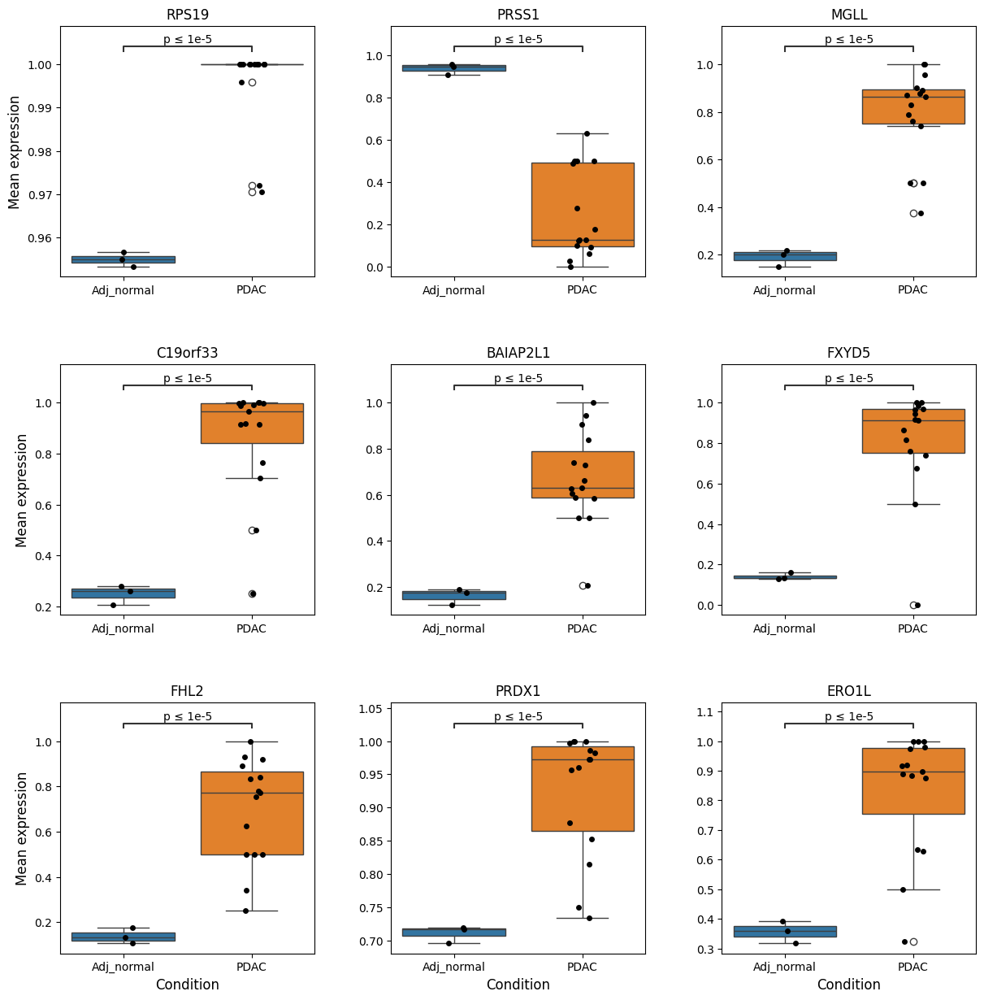

In [ ]:
## Show the first 9 genes
num_items_to_plot = 9
items_to_plot = df_res.iloc[:num_items_to_plot].index.values.tolist()

plot_pct_box( df_all[items_to_plot],
              df_all['Group'],
              ylabel = 'Mean expression',
              ncols = 3,
              figsize = (4,4),
              dpi = 100,
              title = None,
              title_y_pos = 1.05,
              title_fs = 14,
              label_fs = 12,
              tick_fs = 10,
              xtick_rot = 0,
              xtick_ha = 'center',
              annot_ref = None,
              annot_fmt = 'simple',
              annot_fs = 10,
              ws_hs = (0.3, 0.35),
              stripplot = True,
              stripplot_ms = 5 )

#### __D.6 Statistical test for mean-expression of some selected genes__


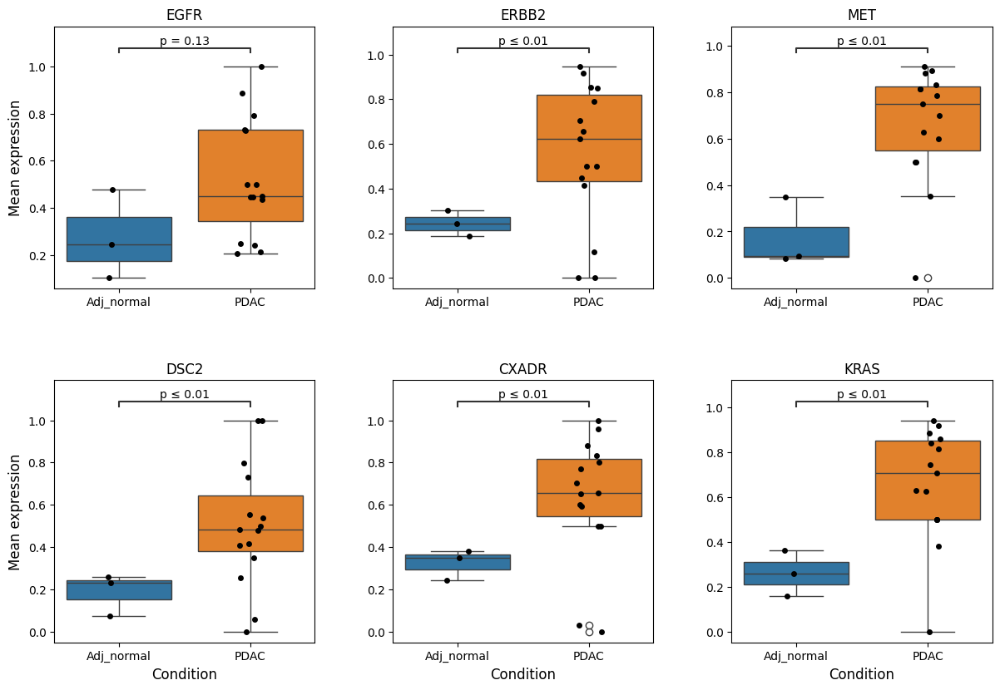

In [ ]:
items_to_plot = ['EGFR', 'ERBB2', 'MET', 'DSC2', 'CXADR', 'KRAS']

b1 = (adata_t.obs['celltype_for_cci'] == 'Aneuploid Ductal cell')
b2 = (adata_t.obs['celltype_for_cci'] == 'Diploid Ductal cell') & (adata_t.obs['condition'] == 'Adj_normal')
b = b1 | b2

adata_s = adata_t[b,:]

df_all = get_gene_expression_mean( adata_s,
                                   genes = [],
                                   group_col = 'sample',
                                   nz_pct = True )

plot_pct_box( df_all[items_to_plot],
              df_all['Group'],
              ylabel = 'Mean expression',
              ncols = 3,
              figsize = (4,4),
              dpi = 100,
              title = None,
              title_y_pos = 1.05,
              title_fs = 14,
              label_fs = 12,
              tick_fs = 10,
              xtick_rot = 0,
              xtick_ha = 'center',
              annot_ref = None,
              annot_fmt = 'simple',
              annot_fs = 10,
              ws_hs = (0.3, 0.35),
              stripplot = True,
              stripplot_ms=5 )

### __E. Gene Set Aanalysis results__
- __GSEApy:__ https://github.com/zqfang/GSEApy

#### __E.1 Structure and format of the GSA/GSEA results__

##### __Structure of the GSA/GSEA results__

<div>
<img src="https://drive.google.com/uc?export=view&id=1RrmkpkWCI1rcfW5cIBfKvip-lX3lkJRL" align="center" width="500"/>
</div>

<div>
<img src=attachment:1369afc9-25a8-4811-bc55-41e7c61309af.png width="500"/>   
</div>

- The GSA/GSEA results are processed and stored separately for each cell type.
- The results were based on the corresponding DEG results.

In [ ]:
adata_t

AnnData object with n_obs × n_vars = 31244 × 23239
    obs: 'sample', 'condition', 'celltype_major', 'celltype_minor', 'celltype_subset', 'sample_ext', 'cnv_ref_ind', 'ploidy_score', 'ploidy_dec', 'ploidy_init_group', 'condition_for_deg', 'sample_for_deg', 'celltype_for_deg', 'celltype_for_cci', 'tumor_origin_ind', 'sample_ext_for_deg', 'celltype_subset_rev'
    var: 'gene_id', 'variable_genes', 'chr', 'spot_no', 'cytogenetic_band'
    uns: 'CCI', 'CCI_sample', 'Celltype_marker_DB', 'DEG', 'DEG_grouping_vars', 'DEG_stat', 'GSA_down', 'GSA_up', 'GSEA', 'HiCAT_summary', 'Pathways_DB', 'analysis_parameters', 'cnv', 'cnv_neighbors_info', 'inferploidy_summary', 'log', 'lut_sample_to_cond', 'usr_param'
    obsm: 'HiCAT_result', 'X_cnv', 'X_cnv_pca', 'X_pca', 'inferploidy_results'
    obsp: 'cnv_neighbor_graph_connectivity', 'cnv_neighbor_graph_distance'

In [ ]:
show_tree(adata_t.uns['GSA_up'], max_depth = 3, n_to_show = 3)

##### __Format of a GSA result__

In [ ]:
adata_t.uns['GSA_up']['Ductal cell']['PDAC_vs_others'].head()

,pval,pval_adj,genes,overlap,pw_size,-log(p-val),-log(q-val),Term,Ind
AGE-RAGE signaling pathway in diabetic complications,1.388428e-04,1.000000e+00,TGFBR2;PLCB1;COL1A1;CASP3;TGFBR1;NFKB1;PLCB3;P...,58,100,3.857477,0.000000,AGE-RAGE signaling pathway in diabetic complic...,1
AMPK signaling pathway,8.767688e-13,2.037523e-08,PPP2R2B;ACACA;EIF4EBP1;PFKFB2;CREB3L1;PPP2CB;R...,86,120,12.057115,7.690897,AMPK signaling pathway,1
Acute myeloid leukemia,1.048962e-04,1.000000e+00,RPS6KB2;EIF4EBP1;TCF7;MTOR;TCF7L2;MYC;NFKB1;RA...,42,67,3.979240,0.000000,Acute myeloid leukemia,1
Adherens junction,8.239218e-09,1.914712e-04,WASL;TGFBR2;CDH1;VCL;FARP2;RHOA;TCF7;TCF7L2;EP...,52,71,8.084114,3.717897,Adherens junction,1
Adipocytokine signaling pathway,1.061841e-04,1.000000e+00,NFKBIA;TRADD;MTOR;NFKB1;PCK2;LEPR;PTPN11;NFKBI...,43,69,3.973940,0.000000,Adipocytokine signaling pathway,1


#### __E.2 Barplot visualization of condition-specific pathways activity__

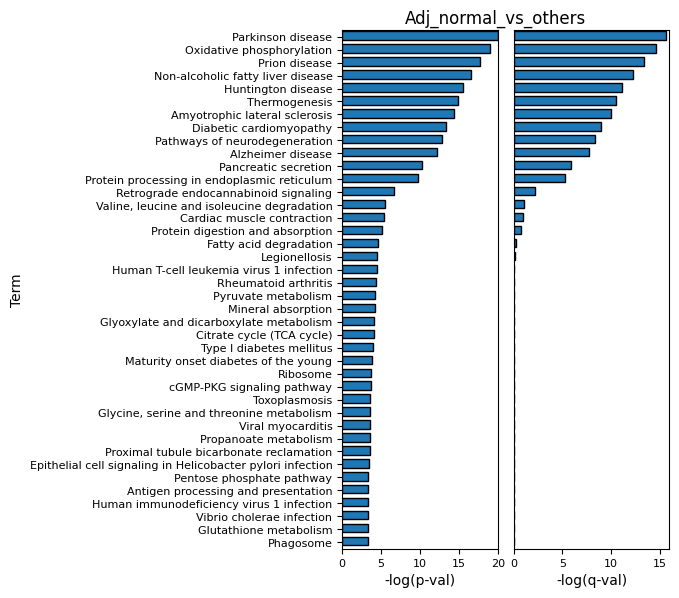

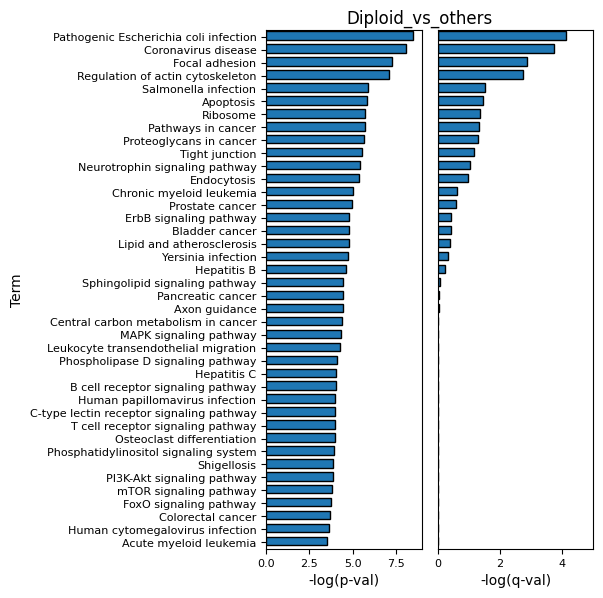

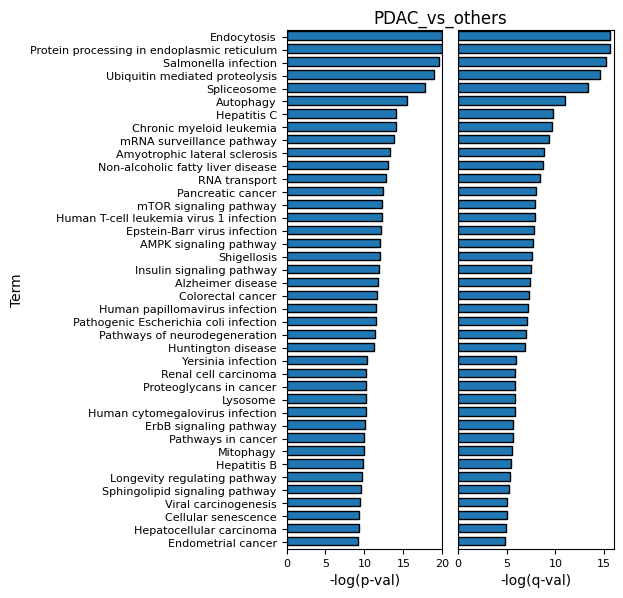

In [ ]:
target_cell = 'Ductal cell'

df_sel_dct = plot_gsa_bar( adata_t.uns['GSA_up'][target_cell],
                           pval_cutoff = 0.05,
                           N_max_to_show = 40,
                           title = None,
                           bar_width = 0.8,
                           title_pos = (0.5, 1),
                           title_fs = 12,
                           title_ha = 'center',
                           label_fs = 10,
                           tick_fs = 8,
                           wspace=0.1,
                           hspace=0.25,
                           Ax = None,
                           facecolor = 'tab:blue',
                           edgecolor = 'black' )

#### __E.3 Dotplot visualization for an overview of condition-specific pathways activity__

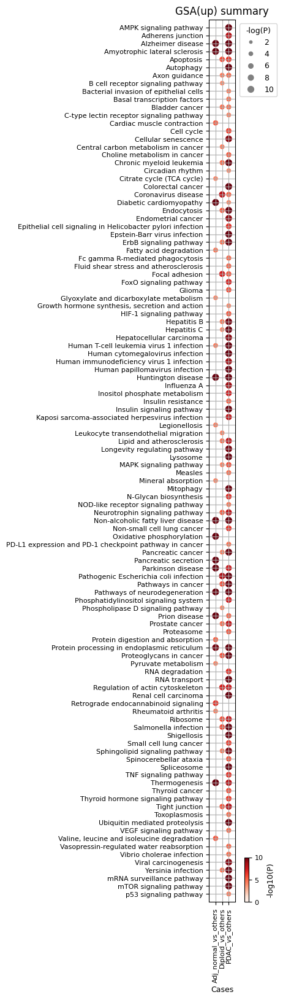

In [ ]:
target_cell = 'Ductal cell'

plot_gsa_dot( adata_t.uns['GSA_up'][target_cell],
              pval_cutoff = 1e-4,
              title = 'GSA(up) summary',
              title_fs = 12,
              tick_fs = 8,
              xtick_rot = 90,
              xtick_ha = 'center',
              label_fs = 9,
              legend_fs = 9,
              swap_ax = False,
              figsize = None,
              dpi = 100,
              dot_size = 50,
              cbar_frac = 0.1,
              cbar_aspect = 10,
              cmap = 'Reds' )

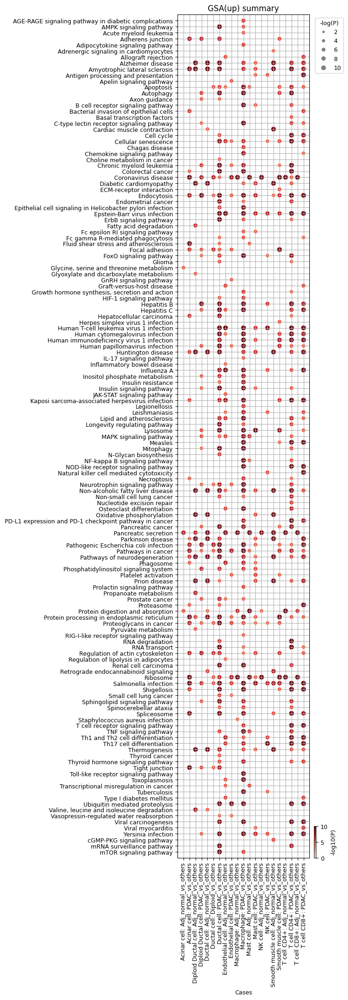

In [ ]:
plot_gsa_dot( adata_t.uns['GSA_up'],
              pval_cutoff = 1e-5,
              title = 'GSA(up) summary',
              title_fs = 12,
              tick_fs = 9,
              xtick_rot = 90,
              xtick_ha = 'center',
              label_fs = 9,
              legend_fs = 9,
              swap_ax = False,
              figsize = None,
              dpi = 100,
              dot_size = 40,
              cbar_frac = 0.05,
              cbar_aspect = 15,
              cmap = 'Reds' )

### __F. GSEA results__
#### Data structure and format are the same as those for GSA results

In [ ]:
show_tree(adata_t.uns['GSEA'], max_depth = 3, n_to_show = 3)

#### __F.1 Barplot visualization of condition-specific pathways activity__

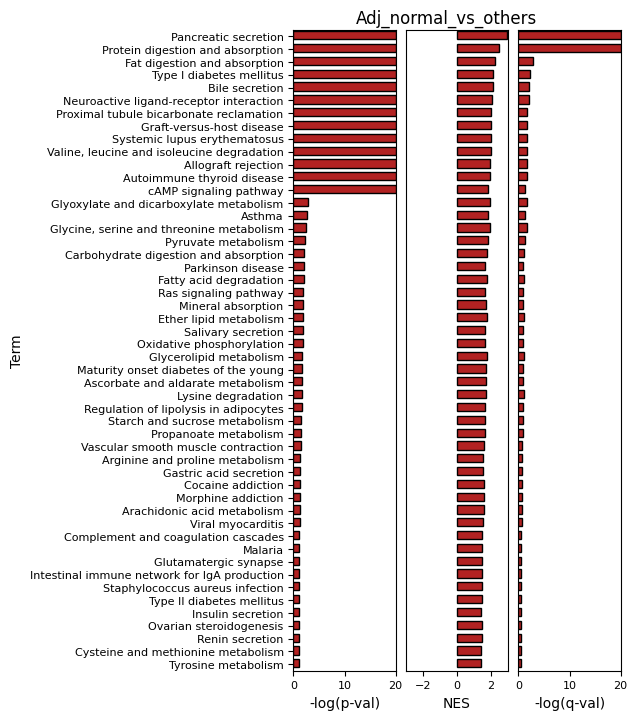

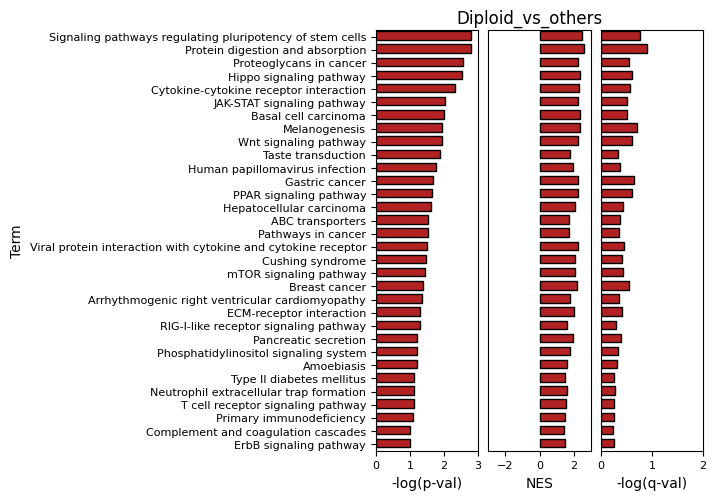

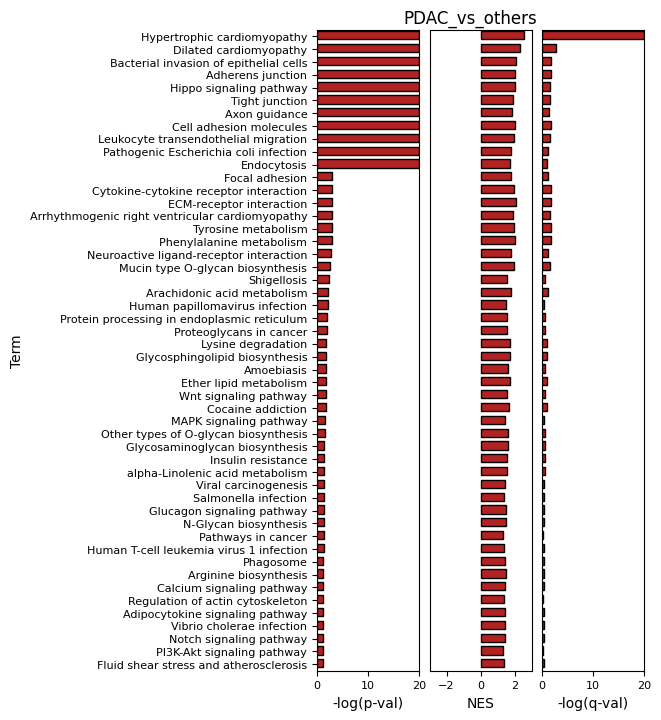

In [ ]:
target_cell = 'Ductal cell'

df_sel_dct = plot_gsa_bar( adata_t.uns['GSEA'][target_cell],
                           pval_cutoff = 1e-1,
                           nes_cutoff = 0,
                           N_max_to_show = 50,
                           title = None,
                           bar_width = 0.8,
                           title_pos = (0.5, 1),
                           title_fs = 12,
                           title_ha = 'center',
                           label_fs = 10,
                           tick_fs = 8,
                           wspace=0.1,
                           hspace=0.25,
                           Ax = None,
                           facecolor = 'firebrick',
                           edgecolor = 'black' )

#### __F.2 Dotplot visualization for an overview of condition-specific pathways activity__

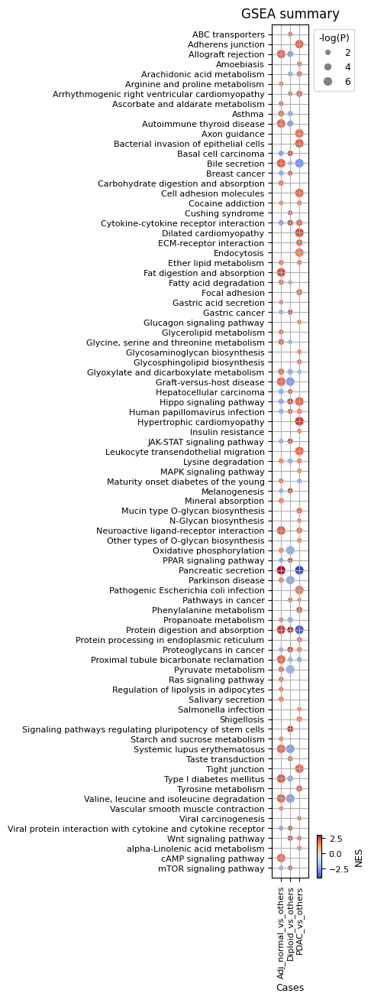

In [ ]:
# target_cell = 'Aneuploid Epithelial cell'
target_cell = 'Ductal cell'

plot_gsa_dot( adata_t.uns['GSEA'][target_cell],
              pval_cutoff = 0.05,
              title = 'GSEA summary',
              title_fs = 12,
              tick_fs = 8,
              xtick_rot = 90,
              xtick_ha = 'center',
              label_fs = 9,
              legend_fs = 9,
              swap_ax = False,
              figsize = None,
              dpi = 100,
              dot_size = 50,
              cbar_frac = 0.1,
              cbar_aspect = 10,
              cmap = 'coolwarm',
              pval_clip = 1e-6)

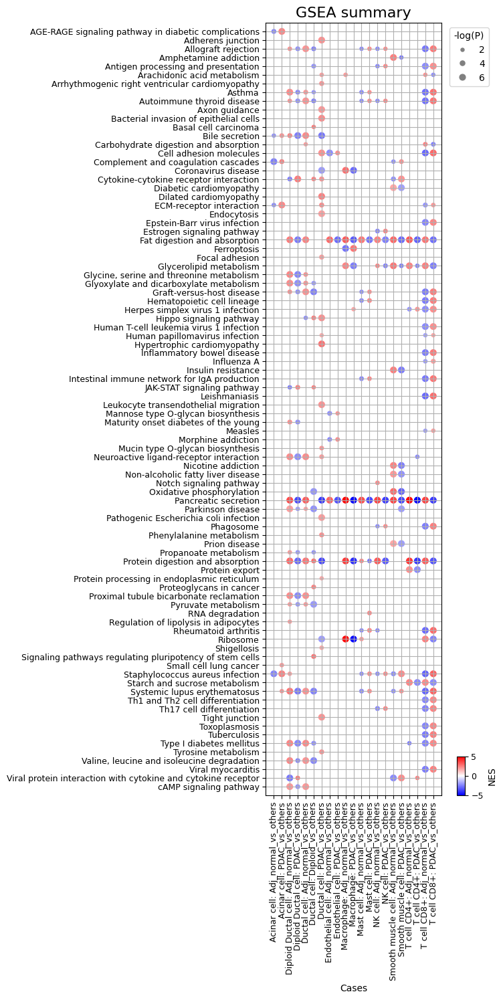

In [ ]:
plot_gsa_dot( adata_t.uns['GSEA'],
              pval_cutoff = 1e-2,
              title = 'GSEA summary',
              title_fs = 16,
              tick_fs = 9,
              xtick_rot = 90,
              xtick_ha = 'center',
              label_fs = 10,
              legend_fs = 10,
              swap_ax = False,
              figsize = None,
              dpi = 100,
              dot_size = 40,
              cbar_frac = 0.2,
              cbar_aspect = 5,
              cmap = 'bwr',
              pval_clip = 1e-6)